The mixed-layer instability overturning stream-function can be defined as

$$\psi_\text{MLI} \simeq \frac{w'b'}{|\nabla_\text{h} b|}\ \ [\text{m}^2\ \text{s}^{-1}]$$

In [2]:
from dask.distributed import Client, LocalCluster
# from dask_jobqueue import SLURMCluster

cluster = LocalCluster()
# cluster = SLURMCluster(cores=12, name='test', walltime='00:30:00',
#                        job_extra=['--constraint=HSW24','--exclusive','--nodes=1'], 
#                        memory='118GB', interface='ib0'
#                       ) 
cluster.scale(12)
# # cluster.adapt(minimum=1, maximum=48)

client = Client(cluster)
# client = Client()
client

/scratch/cnt0024/hmg2840/tuchida/condapack/lib/python3.7/site-packages/distributed/dashboard/core.py:72: UserWarning: 
Failed to start diagnostics server on port 8787. [Errno 13] Permission denied
  warnings.warn("\n" + msg)


Client Scheduler: tcp://127.0.0.1:43688 Dashboard: http://127.0.0.1:39004/status,Cluster Workers: 12 Cores: 84 Memory: 405.28 GB


In [3]:
import xarray as xr
import numpy as np
import xscale
import gsw
import os.path as op
from xgcm.grid import Grid as xgrid
from xnemogcm import open_domain_cfg, open_nemo
from xhistogram.xarray import histogram as xhist

from matplotlib.gridspec import GridSpec
import matplotlib.colors as clr
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
ddir = '/store/CT1/hmg2840/lbrodeau/eNATL60/eNATL60-BLBT02-S/'
xtra = '/store/CT1/hmg2840/lbrodeau/eNATL60/eNATL60-BLBT02X-S'
scratch = '/scratch/cnt0024/hmg2840/tuchida/temp'

In [5]:
g = 9.81
Ce = 0.01
Cp = 4e3
rhoConst = 1e3
ys,ye = (2000,2500)
xs,xe = (2300,3100)
zchunk = 4
z10 = 6

dsmask = xr.open_dataset(op.join(ddir,'../eNATL60-I/mesh_mask_eNATL60_3.6.nc'), 
                         chunks={'z':zchunk}).isel(t=0).isel(y=slice(ys,ye),x=slice(xs,xe))

In [6]:
f = xr.apply_ufunc(gsw.f, dsmask.nav_lat,
                  dask='parallelized', output_dtypes=['float',])
f

<xarray.DataArray 'nav_lat' (y: 500, x: 800)>
dask.array<f, shape=(500, 800), dtype=float64, chunksize=(500, 800), chunktype=numpy.ndarray>
Dimensions without coordinates: y, x

In [7]:
At = (dsmask.e1t * dsmask.e2t)
Au = (dsmask.e1u * dsmask.e2u)
Av = (dsmask.e1v * dsmask.e2v)
A = (dsmask.e1u * dsmask.e2v)
# e1u = dsmask.e1u[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e2u = dsmask.e2u[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e1v = dsmask.e1v[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e2v = dsmask.e2v[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e2t = dsmask.e2t[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e1t = dsmask.e1t[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e2v = dsmask.e2v[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e1u = dsmask.e1u[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e2u = dsmask.e2u[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e1v = dsmask.e1v[0].sel(y=slice(ys,ye),x=slice(xs,xe))
# e3t = dsmask.e3t_1d[0]
# e3w = dsmask.e3w_1d[0]

In [8]:
def filt(da, area=None, m=30, cut=20):
    
    if area is not None:
        win_2D = (da * area).window
    else:
        win_2D = da.window
    
    win_2D.set(window='hanning', cutoff=cut, dim=['y','x'], n=[m,m])
    bw = win_2D.boundary_weights(drop_dims=[])
    da_LS = win_2D.convolve(weights=bw)
    
    if area is not None:
        area_win = area.window
        area_win.set(window='hanning', cutoff=cut, dim=['y','x'], n=[m,m])
        bw = area_win.boundary_weights(drop_dims=[])
        da_LS *= area_win.convolve(weights=bw)**-1
    
    da_SS = da - da_LS
    
    return da_SS

# Jan. 1, 2010

In [9]:
dsT = xr.open_dataset(op.join(xtra,'00788401-00842400/eNATL60-BLBT02X_1h_20100101_20100125_gridT_20100101-20100101.nc'),
                      chunks={'deptht':zchunk}
                     ).sel(deptht=slice(None,810))
dsS = xr.open_dataset(op.join(xtra,'00788401-00842400/eNATL60-BLBT02X_1h_20100101_20100125_gridS_20100101-20100101.nc'),
                      chunks={'deptht':zchunk}
                     ).sel(deptht=slice(None,810))

#         if i == days[0,0]:
maskT = dsmask.tmask.isel(z=slice(None,len(dsT.deptht)))

CT01 = dsT.votemper[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                           ).where(xr.DataArray(maskT.data, dims=['deptht','y','x']
                                               ) != 0.)
SA01 = dsS.vosaline[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                           ).where(xr.DataArray(maskT.data, dims=['deptht','y','x']
                                               ) != 0.)

sig01 = xr.apply_ufunc(gsw.sigma0, SA01, CT01, dask='parallelized', output_dtypes=[float,])
b01 = -g*sig01*1e-3
sig01

<xarray.DataArray (deptht: 95, y: 500, x: 800)>
dask.array<sigma0, shape=(95, 500, 800), dtype=float64, chunksize=(4, 500, 800), chunktype=numpy.ndarray>
Coordinates:
  * deptht        (deptht) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
    nav_lat       (y, x) float32 36.69535 36.695553 ... 43.21733 43.217693
    nav_lon       (y, x) float32 -59.623344 -59.606667 ... -46.464603 -46.447792
    time_counter  datetime64[ns] 2010-01-01T23:30:00
Dimensions without coordinates: y, x

In [10]:
dsU = xr.open_dataset(op.join(xtra,'00788401-00842400/eNATL60-BLBT02X_1h_20100101_20100125_gridU_20100101-20100101.nc'),
                      chunks={'depthu':zchunk}
                     ).sel(depthu=slice(None,810))
dsV = xr.open_dataset(op.join(xtra,'00788401-00842400/eNATL60-BLBT02X_1h_20100101_20100125_gridV_20100101-20100101.nc'),
                      chunks={'depthv':zchunk}
                     ).sel(depthv=slice(None,810))
dsW = xr.open_dataset(op.join(xtra,'00788401-00842400/eNATL60-BLBT02X_1h_20100101_20100125_gridW_20100101-20100101.nc'),
                      chunks={'depthw':zchunk}
                     ).sel(depthw=slice(None,810))

maskU = dsmask.umask.isel(z=slice(None,len(dsU.depthu)))
maskV = dsmask.vmask.isel(z=slice(None,len(dsV.depthv)))
u01 = dsU.vozocrtx[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                          ).where(xr.DataArray(maskU.data, dims=['depthu','y','x']
                                              ) != 0.)
v01 = dsV.vomecrty[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                          ).where(xr.DataArray(maskV.data, dims=['depthv','y','x']
                                              ) != 0.)
w01 = dsW.vovecrtz[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                          ).where(xr.DataArray(maskT.data, dims=['depthw','y','x']
                                              ) != 0.)
u01

<xarray.DataArray 'vozocrtx' (depthu: 95, y: 500, x: 800)>
dask.array<where, shape=(95, 500, 800), dtype=float32, chunksize=(4, 500, 800), chunktype=numpy.ndarray>
Coordinates:
  * depthu         (depthu) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
    nav_lat        (y, x) float32 dask.array<chunksize=(500, 800), meta=np.ndarray>
    nav_lon        (y, x) float32 dask.array<chunksize=(500, 800), meta=np.ndarray>
    time_centered  datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
    time_counter   datetime64[ns] 2010-01-01T23:30:00
Dimensions without coordinates: y, x
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           ocean current along i-axis
    units:               m/s
    online_operation:    average
    interval_operation:  40 s
    interval_write:      1 h
    cell_methods:        time: mean (interval: 40 s)

In [11]:
nMLD = z10 + np.abs((sig01.isel(deptht=slice(z10,None))
                     - sig01.isel(deptht=z10)
                    )-0.03).argmin(dim='deptht').compute()
MLD01 = (xr.ones_like(sig01) * sig01.deptht
        )[{'deptht':nMLD}].load()
MLD01

<xarray.DataArray (y: 500, x: 800)>
array([[ 86.14549255,  97.25676727, 109.03300476, ..., 201.75366211,
        201.75366211, 201.75366211],
       [ 80.83911133,  86.14549255, 103.06175232, ..., 201.75366211,
        201.75366211, 201.75366211],
       [ 75.69881439,  80.83911133,  91.6180191 , ..., 201.75366211,
        201.75366211, 201.75366211],
       ...,
       [ 70.72447968,  75.69881439,  80.83911133, ..., 141.38201904,
        141.38201904, 141.38201904],
       [ 75.69881439,  80.83911133,  86.14549255, ..., 134.58006287,
        134.58006287, 134.58006287],
       [ 80.83911133,  86.14549255,  91.6180191 , ..., 127.94409943,
        127.94409943, 134.58006287]])
Coordinates:
    deptht        (y, x) float64 86.15 97.26 109.0 115.2 ... 127.9 127.9 134.6
    nav_lat       (y, x) float32 36.69535 36.695553 ... 43.21733 43.217693
    nav_lon       (y, x) float32 -59.623344 -59.606667 ... -46.464603 -46.447792
    time_counter  datetime64[ns] 2010-01-01T23:30:00
Dimensions without coordinates: y, x

In [12]:
bx = (b01.isel(x=slice(1,None))
      + b01.isel(x=slice(None,-1)).data
     ) * .5
by = (b01.isel(y=slice(1,None))
      + b01.isel(y=slice(None,-1)).data
     ) * .5
dbx = bx.diff(dim='x') * dsmask.e1u.isel(x=slice(1,-1))**-1
dby = by.diff(dim='y') * dsmask.e2v.isel(y=slice(1,-1))**-1

db01 = np.sqrt(dbx.isel(y=slice(1,-1))**2 + dby.isel(x=slice(1,-1))**2)


ws01 = filt(w01, area=At).chunk({'depthw':-1})
bs01 = filt(b01, area=At)
wsbs01 = (bs01.isel(deptht=slice(None,-1))
          * ws01.interp({'depthw':bs01.deptht.isel(deptht=slice(None,-1)).data},
                        method='linear').data
         )

In [13]:
psiMLI01 = (wsbs01.isel(y=slice(1,-1),x=slice(1,-1)) * db01**-1).compute()
psiMLI01

<xarray.DataArray (deptht: 94, y: 498, x: 798)>
array([[[-3.97796232e-04,  3.94629577e-04, -3.91699235e-05, ...,
         -1.18897665e-03,  2.09448427e-03,  3.46401399e-02],
        [-1.12379552e-03,  3.01450828e-04,  9.23374385e-04, ...,
         -7.92286057e-04,  1.05236499e-03,  1.72418253e-02],
        [-9.94899712e-04, -1.84704699e-04,  7.01900302e-04, ...,
          1.89732106e-04,  1.02076757e-03,  1.35134557e-02],
        ...,
        [ 3.12243790e-03,  3.38897875e-04,  1.20352958e-04, ...,
         -4.17230627e-04,  1.56741817e-03,  1.89320341e-03],
        [ 1.64037210e-03, -8.56739823e-04,  4.07652179e-03, ...,
         -2.94285814e-03,  1.02540889e-03,  2.86930729e-03],
        [-1.41929050e-04,  1.91305116e-04,  1.07932450e-02, ...,
         -5.27133819e-03, -8.80820740e-04,  2.54768382e-03]],

       [[-1.28810530e-03,  1.28052477e-03, -1.24966227e-04, ...,
         -3.85613066e-03,  6.77400595e-03,  1.12260825e-01],
        [-3.64151356e-03,  9.77919398e-04,  2.99915075e-03, ...,
         -2.57055876e-03,  3.40716238e-03,  5.58885373e-02],
        [-3.22517522e-03, -5.99036827e-04,  2.28069920e-03, ...,
          6.14709150e-04,  3.30968093e-03,  4.38136234e-02],
        ...,
        [ 1.00995852e-02,  1.09471574e-03,  4.01545156e-04, ...,
         -1.33789300e-03,  5.09124753e-03,  6.14090263e-03],
        [ 5.30992514e-03, -2.77078698e-03,  1.31872024e-02, ...,
         -9.51245288e-03,  3.35152389e-03,  9.32110861e-03],
        [-4.59485498e-04,  6.02022481e-04,  3.48783947e-02, ...,
         -1.70328184e-02, -2.80874374e-03,  8.30008613e-03]],

       [[-2.29952620e-03,  2.30002066e-03, -1.91510287e-04, ...,
         -6.91910609e-03,  1.20825447e-02,  2.00781764e-01],
        [-6.50320447e-03,  1.75192652e-03,  5.39693283e-03, ...,
         -4.60527818e-03,  6.08627697e-03,  1.00026635e-01],
        [-5.75231704e-03, -1.07248891e-03,  4.10122853e-03, ...,
          1.09978513e-03,  5.92710598e-03,  7.84397608e-02],
        ...,
        [ 1.79867808e-02,  1.94580710e-03,  7.48943505e-04, ...,
         -2.36468963e-03,  9.12227278e-03,  1.09981243e-02],
        [ 9.47550521e-03, -4.93994079e-03,  2.34732654e-02, ...,
         -1.69740910e-02,  6.04206546e-03,  1.67116938e-02],
        [-8.20905393e-04,  9.94727641e-04,  6.19324003e-02, ...,
         -3.04536433e-02, -4.97121857e-03,  1.48891611e-02]],

       ...,

       [[-8.52902472e-01,  8.86662618e-02,  8.26206227e-01, ...,
          9.35600878e-01,  3.70590934e-01, -8.26507827e-02],
        [ 3.95376873e-02,  7.94619916e-01,  1.51304393e+00, ...,
          9.90494804e-01,  3.29602895e-01, -4.23229737e-02],
        [ 3.33303319e-01,  1.17678504e+00,  1.76449067e+00, ...,
          1.18286215e+00,  3.46069688e-01,  3.74348713e-03],
        ...,
        [ 1.14316932e+00, -1.07115461e-01, -9.82175539e-01, ...,
         -2.82907593e-02, -1.30213874e-02, -1.02528905e-01],
        [ 5.23360348e-01, -6.46220738e-01, -1.27696003e+00, ...,
         -1.80340898e-01,  1.05292492e-02, -2.72355639e-01],
        [ 1.82610021e-02, -9.13685699e-01, -1.14375303e+00, ...,
         -3.92642680e-01,  1.33989944e-01, -2.90696897e-01]],

       [[-1.14519201e+00, -5.45206449e-03,  9.31785927e-01, ...,
          7.37492044e-01,  8.32622115e-02, -2.16734738e-01],
        [-2.39888682e-01,  6.71762910e-01,  1.63690589e+00, ...,
          7.71736981e-01,  1.03525460e-01, -9.40494921e-02],
        [ 3.96609141e-02,  1.03047810e+00,  1.91136374e+00, ...,
          9.44427774e-01,  1.33138897e-01,  2.65302746e-02],
        ...,
        [ 6.64865048e-01, -2.14864589e-01, -8.68223079e-01, ...,
          1.68581432e-02, -3.97115611e-02, -1.70507027e-01],
        [ 4.88087946e-01, -4.35069428e-01, -1.11820411e+00, ...,
         -1.91620355e-01,  4.37152570e-02, -2.60717444e-01],
        [ 3.25677955e-01, -6.95298121e-01, -1.14814900e+00, ...,
         -5.33350591e-01,  2.08570549e-01, -1.49441686e-01]],

       [[-1.48379507e+00, -3.61038528e-01,  8.06035686e-01, ...,
          3.8741771

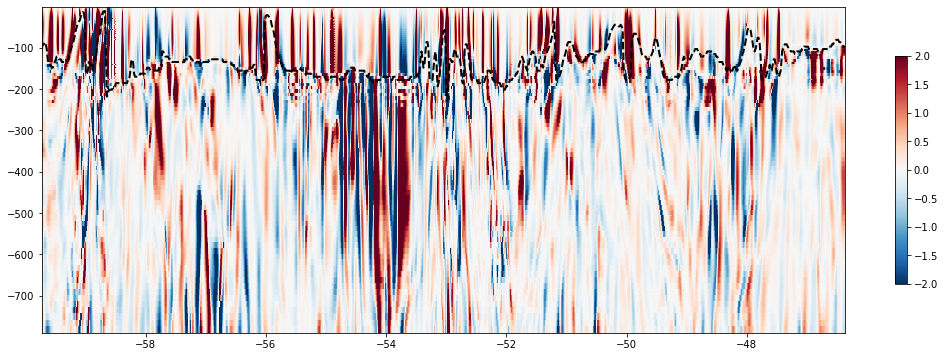

In [15]:
fig, ax = plt.subplots(figsize=(18,6))
im = ax.pcolormesh(dsmask.nav_lon[300,1:-1], -psiMLI01.deptht,
                   psiMLI01[:,299], cmap='RdBu_r', vmin=-2e0, vmax=2e0, rasterized=True)
ax.plot(dsmask.nav_lon[300], -MLD01[300], c='k', ls='--', lw=2)

ax.set_xlim([dsmask.nav_lon[300].min(), 
             dsmask.nav_lon[300].max()])
fig.colorbar(im, ax=ax, shrink=.7)

In [11]:
uz = u01.diff('depthu')*xr.DataArray(e3w[1:len(u01.depthu)].data, dims='depthu')**-1
vz = v01.diff('depthv')*xr.DataArray(e3w[1:len(v01.depthv)].data, dims='depthv')**-1
Ri01_1 = N201[:,:-1,:-1]**-1 * ((.5*(uz.data[:,:-1,1:]+uz.data[:,:-1,:-1]))**2 
                              + (.5*(vz.data[:,1:,:-1]+vz.data[:,:-1,:-1]))**2).compute()
Ri01_1

<xarray.DataArray (depthw: 94, y: 499, x: 799)>
array([[[-2.52701539e+03, -2.47950206e+03, -2.43821973e+03, ...,
         -1.47284041e+03, -1.46475126e+03, -1.45671663e+03],
        [-2.53702187e+03, -1.99905948e+03, -1.96510292e+03, ...,
         -8.01279681e+02, -1.46724288e+03, -1.45778069e+03],
        [-2.53892479e+03, -2.51148665e+03, -1.97780248e+03, ...,
         -1.48031410e+03, -1.47094981e+03, -1.45913159e+03],
        ...,
        [-2.40130971e+03, -2.38229253e+03, -2.36977070e+03, ...,
         -1.98779153e+03, -1.99264426e+03,  2.42257813e+04],
        [-2.38751452e+03, -2.37412871e+03, -2.38240186e+03, ...,
          1.09327360e+05, -2.17751746e+03, -2.17939522e+03],
        [-2.38361355e+03, -2.38697943e+03,  7.79907508e+03, ...,
          2.09968742e+04, -2.21170577e+03, -2.21124439e+03]],

       [[-1.39337271e+03, -1.36111990e+03, -1.11095305e+03, ...,
         -4.87000891e+02, -8.35755000e+02, -8.25178209e+02],
        [-1.39424678e+03, -1.71855959e+03, -1.34780897e+03, ...,
         -8.51119135e+02, -8.39359737e+02, -8.27089609e+02],
        [-1.73238671e+03, -1.72571531e+03, -1.35925528e+03, ...,
         -8.55792906e+02, -9.64601202e+02, -8.29257213e+02],
        ...,
        [-1.33537290e+03, -1.31362938e+03, -1.22003321e+03, ...,
         -9.95144143e+02, -9.95288990e+02, -9.38624274e+02],
        [-1.31348918e+03, -1.21779333e+03, -1.31103625e+03, ...,
         -9.50162591e+02, -1.00498273e+03, -1.00354671e+03],
        [-1.30321799e+03, -1.30878156e+03, -1.35080195e+03, ...,
         -9.60448614e+02, -1.01531193e+03, -1.01351444e+03]],

       [[-9.89802645e+02, -8.02402577e+02, -7.83089573e+02, ...,
         -5.84622960e+02, -5.09131629e+02, -4.98152099e+02],
        [-1.23265782e+03, -8.11695760e+02, -7.94116619e+02, ...,
         -5.24727416e+02, -3.09865681e+02, -5.00391181e+02],
        [-1.21562348e+03, -9.76303311e+02, -9.62338309e+02, ...,
         -5.29235830e+02, -5.17634505e+02, -5.02751687e+02],
        ...,
        [-7.33118799e+02, -7.16034356e+02, -7.07933428e+02, ...,
         -4.97906419e+02, -5.23584556e+02, -5.53589978e+02],
        [-7.55965366e+02, -7.03546652e+02, -7.59034093e+02, ...,
         -5.30394118e+02, -5.27129271e+02, -2.64116843e+03],
        [-7.05226460e+02, -7.12663170e+02, -7.52495828e+02, ...,
         -5.33439451e+02, -5.30490684e+02, -5.59291506e+02]],

       ...,

       [[ 1.60703041e-01,  2.63530665e-01,  4.48265948e-01, ...,
          8.86232636e-02,  1.09811671e-01,  8.93756824e-02],
        [ 1.08156329e-01,  1.97512952e-01,  4.02354629e-01, ...,
          9.02444515e-02,  1.10915931e-01,  9.01963788e-02],
        [ 8.20340410e-02,  1.35983199e-01,  3.45679988e-01, ...,
          9.14887136e-02,  1.11781999e-01,  8.89402499e-02],
        ...,
        [ 1.12194238e-01,  7.43060755e-02,  3.39531389e-02, ...,
          6.48035659e-02,  5.96739650e-02,  4.63806632e-02],
        [ 5.67377324e-02,  2.57557372e-02,  1.00733203e-02, ...,
          5.30896027e-02,  5.14141468e-02,  3.78181150e-02],
        [ 3.63752741e-02,  1.47218037e-02,  6.18714744e-03, ...,
          3.80010047e-02,  3.66462154e-02,  2.70918676e-02]],

       [[ 2.65441486e-01,  2.35577682e-01,  1.24489304e-01, ...,
          6.56190436e-02,  1.20424297e-01,  1.17336105e-01],
        [ 3.06450797e-01,  2.88683139e-01,  1.43372077e-01, ...,
          7.21859772e-02,  1.24098643e-01,  1.15962876e-01],
        [ 3.19398699e-01,  3.24186932e-01,  1.66164187e-01, ...,
          7.89982858e-02,  1.27450819e-01,  1.11242147e-01],
        ...,
        [ 8.00662725e-02,  5.59574008e-02,  3.50363830e-02, ...,
          2.41151796e-02,  2.63524798e-02,  3.90689064e-02],
        [ 7.32127960e-02,  4.33624209e-02,  2.05176098e-02, ...,
          2.00522885e-02,  2.17299340e-02,  2.81791115e-02],
        [ 3.46206899e-02,  1.72553091e-02,  1.22746890e-02, ...,
          2.03870069e-02,  2.53473202e-02,  3.19263991e-02]],

       [[ 5.65271361e-01,  7.87722469e-01,  5.76154739e-01, ...,
          2.8834668

/scratch/cnt0024/hmg2840/tuchida/condapack/lib/python3.7/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


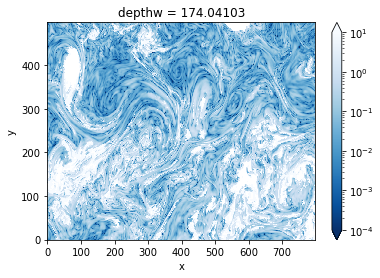

In [28]:
Ri01_1[40].plot(cmap='Blues_r',norm=clr.LogNorm(vmax=1e1, vmin=1e-4))

In [17]:
vx = (v01*e2v).diff('x')
vx = .5*(vx[:,1:]+vx[:,:-1])
uy = (u01*e1u).diff('y')
uy = .5*(uy[:,:,1:]+uy[:,:,:-1])

vx = .5*(vx[:,1:]+vx[:,:-1])
vx = .5*(vx[:,:,1:]+vx[:,:,:-1])
uy = .5*(uy[:,1:]+uy[:,:-1])
uy = .5*(uy[:,:,1:]+uy[:,:,:-1])
zeta01 = (xr.DataArray(vx.data - uy.data, dims=['deptht','y','x'],
                      coords={'deptht':CT01.deptht.data}) * At[1:-1,1:-1]**-1
         ).compute()
zeta01

<xarray.DataArray (deptht: 95, y: 498, x: 798)>
array([[[-4.89969874e-06, -1.48732231e-05, -1.87248463e-05, ...,
         -1.35637765e-05, -5.68967718e-06,  4.16059715e-06],
        [ 3.52938232e-06, -1.31685111e-05, -2.04923993e-05, ...,
         -1.40106896e-05, -8.19409195e-06,  1.89270865e-06],
        [ 1.47242340e-05, -8.69957425e-06, -2.07901260e-05, ...,
         -1.25109700e-05, -9.38463537e-06, -3.19764477e-07],
        ...,
        [ 9.27627790e-06,  1.48959911e-05,  2.06377265e-05, ...,
         -1.68305151e-05, -1.62726014e-05, -1.54168383e-05],
        [ 1.34772473e-05,  2.12952838e-05,  2.64439172e-05, ...,
         -1.67756284e-05, -1.69156921e-05, -1.64154149e-05],
        [ 1.90377114e-05,  2.66074067e-05,  2.68040345e-05, ...,
         -1.43289392e-05, -1.58046406e-05, -1.64993083e-05]],

       [[-4.85933393e-06, -1.48307812e-05, -1.86902603e-05, ...,
         -1.35685979e-05, -5.69697824e-06,  4.14832658e-06],
        [ 3.55978059e-06, -1.31290293e-05, -2.04558488e-05, ...,
         -1.40176334e-05, -8.20088037e-06,  1.88329752e-06],
        [ 1.47432030e-05, -8.66641300e-06, -2.07548561e-05, ...,
         -1.25209293e-05, -9.39362401e-06, -3.28258091e-07],
        ...,
        [ 9.28304999e-06,  1.48975927e-05,  2.06241447e-05, ...,
         -1.68182865e-05, -1.62605567e-05, -1.54052256e-05],
        [ 1.34759608e-05,  2.12824956e-05,  2.64164355e-05, ...,
         -1.67609631e-05, -1.69004257e-05, -1.63998836e-05],
        [ 1.90238361e-05,  2.65816788e-05,  2.67761721e-05, ...,
         -1.43197071e-05, -1.57939870e-05, -1.64856709e-05]],

       [[-4.81082503e-06, -1.47758314e-05, -1.86453879e-05, ...,
         -1.35705006e-05, -5.70408725e-06,  4.13099517e-06],
        [ 3.59130924e-06, -1.30786944e-05, -2.04072710e-05, ...,
         -1.40224212e-05, -8.20612481e-06,  1.87192552e-06],
        [ 1.47557025e-05, -8.62570917e-06, -2.07074606e-05, ...,
         -1.25304122e-05, -9.40179263e-06, -3.37237913e-07],
        ...,
        [ 9.30149835e-06,  1.49049124e-05,  2.06019989e-05, ...,
         -1.68159783e-05, -1.62563925e-05, -1.54005991e-05],
        [ 1.34790495e-05,  2.12626692e-05,  2.63684020e-05, ...,
         -1.67576780e-05, -1.68938867e-05, -1.63908443e-05],
        [ 1.90035366e-05,  2.65377287e-05,  2.67282546e-05, ...,
         -1.43245608e-05, -1.57953898e-05, -1.64806996e-05]],

       ...,

       [[ 2.46781108e-05,  3.19759111e-05,  3.48486468e-05, ...,
         -6.70625010e-06, -9.00652433e-06, -9.67241696e-06],
        [ 2.28458741e-05,  3.08409253e-05,  3.49184568e-05, ...,
         -7.06977255e-06, -9.75774265e-06, -1.01942286e-05],
        [ 2.10037132e-05,  2.90547729e-05,  3.45324850e-05, ...,
         -7.34827028e-06, -1.04225365e-05, -1.06539446e-05],
        ...,
        [ 1.60033651e-06,  3.20535176e-06,  3.60515133e-06, ...,
         -2.61620442e-06, -1.38449484e-06,  1.34424852e-06],
        [ 3.07132483e-06,  3.17517625e-06,  2.24985605e-06, ...,
         -4.49174879e-06, -4.66267427e-06, -3.03647661e-06],
        [ 1.32344256e-06,  2.16137770e-07, -1.26324954e-06, ...,
         -5.42933788e-06, -6.67902658e-06, -6.53235173e-06]],

       [[ 2.03629683e-05,  2.49708671e-05,  2.92156095e-05, ...,
         -1.12946280e-05, -1.07152920e-05, -8.50961158e-06],
        [ 1.76977144e-05,  2.19778512e-05,  2.71705136e-05, ...,
         -1.14240589e-05, -1.10219482e-05, -8.49959770e-06],
        [ 1.62772984e-05,  1.92872723e-05,  2.52007684e-05, ...,
         -1.14107096e-05, -1.12810436e-05, -8.55296149e-06],
        ...,
        [ 4.38424255e-06,  5.92896321e-06,  6.00296116e-06, ...,
         -1.66832809e-06, -8.58247461e-08,  3.04783879e-06],
        [ 4.39286781e-06,  4.04679436e-06,  2.66910251e-06, ...,
         -4.20575621e-06, -4.33487423e-06, -2.55236663e-06],
        [ 7.02595888e-07, -9.39869472e-07, -2.83175132e-06, ...,
         -5.21520138e-06, -6.74339421e-06, -6.91741387e-06]],

       [[ 1.99185335e-05,  1.86348894e-05,  1.78132207e-05, ...,
         -1.3238773

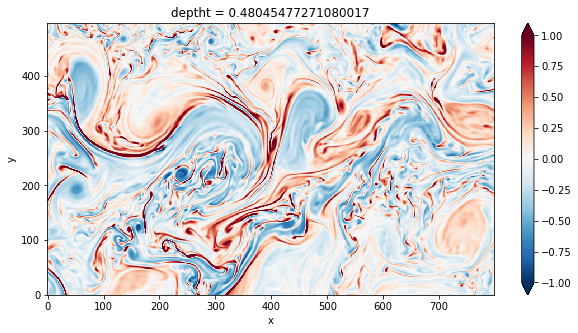

In [18]:
(zeta01[0]*f[1:-1,1:-1]**-1).plot(figsize=(10,5), vmax=1)

In [20]:
ux = (u01*e2u).diff('x') * At[:,:-1]
# ux = .5*(ux[:,:,1:]+ux[:,:,:-1])
vy = (v01*e1v).diff('y') * At[:-1]
# vy = .5*(vy[:,1:]+vy[:,:-1])
wx = (w01*e2t).diff('x') * Au[:,1:]
wy = (w01*e1t).diff('y') * Av[1:]
wx = .5*(wx[:,:,1:]+wx[:,:,:-1])
wy = .5*(wy[:,1:]+wy[:,:-1])
# bz = xr.DataArray((-b01.diff('deptht') * xr.DataArray(e3w[1:len(w01.depthw)],dims='deptht')**-1).data,
#                  dims=['depthw','y','x'],
#                  coords={'depthw':w01.depthw[1:].data})
bz = N201.copy()

ux,bx,vx,by,wx,bz

(<xarray.DataArray (depthu: 95, y: 500, x: 799)>
 dask.array<mul, shape=(95, 500, 799), dtype=float64, chunksize=(4, 500, 799), chunktype=numpy.ndarray>
 Coordinates:
   * depthu         (depthu) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
     nav_lat        (y, x) float32 dask.array<chunksize=(500, 799), meta=np.ndarray>
     nav_lon        (y, x) float32 dask.array<chunksize=(500, 799), meta=np.ndarray>
     time_centered  datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
     time_counter   datetime64[ns] 2010-01-01T23:30:00
 Dimensions without coordinates: y, x,
 <xarray.DataArray (deptht: 95, y: 500, x: 798)>
 dask.array<mul, shape=(95, 500, 798), dtype=float64, chunksize=(4, 500, 798), chunktype=numpy.ndarray>
 Coordinates:
   * deptht        (deptht) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
     time_counter  datetime64[ns] 2010-01-01T23:30:00
 Dimensions without coordinates: y, x,
 <xarray.DataArray (depthv: 95, y: 498, x: 798)>
 dask.array<mul, shape=(95, 

In [27]:
uy,bx,vy,by,wy,bz

(<xarray.DataArray (depthu: 95, y: 498, x: 798)>
 dask.array<mul, shape=(95, 498, 798), dtype=float64, chunksize=(4, 498, 798), chunktype=numpy.ndarray>
 Coordinates:
   * depthu         (depthu) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
     time_centered  datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
     time_counter   datetime64[ns] 2010-01-01T23:30:00
 Dimensions without coordinates: y, x,
 <xarray.DataArray (deptht: 95, y: 500, x: 798)>
 dask.array<mul, shape=(95, 500, 798), dtype=float64, chunksize=(4, 500, 798), chunktype=numpy.ndarray>
 Coordinates:
   * deptht        (deptht) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
     time_counter  datetime64[ns] 2010-01-01T23:30:00
 Dimensions without coordinates: y, x,
 <xarray.DataArray (depthv: 95, y: 499, x: 800)>
 dask.array<mul, shape=(95, 499, 800), dtype=float64, chunksize=(4, 499, 800), chunktype=numpy.ndarray>
 Coordinates:
   * depthv         (depthv) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
  

In [21]:
uxbx = (bx*ux.data[:,:,:-1])[:,1:-1]
vxby = by[:,:,1:-1]*(vx.data*At[1:-1,1:-1]**-1)
wxbz = (wx*bz[:,:,1:-1])[:,1:-1]
q1 = -(xr.DataArray((uxbx + vxby).chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                   dims=['depthw','y','x'],
                   coords={'depthw':dsW.depthw[1:].data}) + wxbz)
       
uybx = bx[:,1:-1]*(uy.data*At[1:-1,1:-1]**-1)
vyby = (by*vy.data[:,:-1])[:,:,1:-1]
wybz = (wy*bz[:,1:-1])[:,:,1:-1]
q2 = -(xr.DataArray((uybx + vyby).chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                   dims=['depthw','y','x'],
                   coords={'depthw':dsW.depthw.data[1:]}) + wybz)

q1, q2

(<xarray.DataArray (depthw: 94, y: 498, x: 798)>
 dask.array<neg, shape=(94, 498, 798), dtype=float64, chunksize=(4, 498, 798), chunktype=numpy.ndarray>
 Coordinates:
   * depthw         (depthw) float32 1.0000261 2.156828 ... 782.4387 797.9545
     time_centered  datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
     time_counter   datetime64[ns] 2010-01-01T23:30:00
 Dimensions without coordinates: y, x,
 <xarray.DataArray (depthw: 94, y: 498, x: 798)>
 dask.array<neg, shape=(94, 498, 798), dtype=float64, chunksize=(4, 498, 798), chunktype=numpy.ndarray>
 Coordinates:
   * depthw         (depthw) float32 1.0000261 2.156828 ... 782.4387 797.9545
     time_centered  datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
     time_counter   datetime64[ns] 2010-01-01T23:30:00
 Dimensions without coordinates: y, x)

In [22]:
Fs01 = (q1*xr.DataArray(bx[:,1:-1].chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                     dims=['depthw','y','x'],
                     coords={'depthw':dsW.depthw[1:].data}) 
      + q2*xr.DataArray(by[:,:,1:-1].chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                       dims=['depthw','y','x'],
                       coords={'depthw':dsW.depthw[1:].data})
       ).compute()
normFs01 = (Fs01 * np.sqrt(xr.DataArray(bx[:,1:-1].chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                                   dims=['depthw','y','x'],
                                   coords={'depthw':dsW.depthw[1:].data})**2
                      + xr.DataArray(by[:,:,1:-1].chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                                     dims=['depthw','y','x'],
                                     coords={'depthw':dsW.depthw[1:].data})**2)**-1
           ).compute()
normFs01

<xarray.DataArray (depthw: 94, y: 498, x: 798)>
array([[[ 11.66252624,  10.44459503,   7.73220248, ...,  -0.11378762,
           0.39709452,   0.64630213],
        [ 11.63721434,  11.48255971,   8.96897866, ...,  -0.43265462,
           0.1527129 ,   0.37984391],
        [ 11.61469996,  12.42874265,  10.0662706 , ...,  -0.30799812,
           0.30895536,   0.28824723],
        ...,
        [ -2.07494759,  -1.46638447,   0.46141931, ...,  -1.6075751 ,
          -1.7243333 ,  -1.74679619],
        [ -1.8702966 ,  -0.58283807,   1.73013874, ...,  -1.39077347,
          -1.65926834,  -1.78303954],
        [ -1.23391896,   1.14171426,   1.27286057, ...,  -1.13720847,
          -1.35616508,  -1.52255456]],

       [[ 11.66668524,  10.43617084,   7.72497647, ...,  -0.11380283,
           0.3964403 ,   0.64548582],
        [ 11.65420835,  11.48080277,   8.96133224, ...,  -0.4312766 ,
           0.15241103,   0.37946585],
        [ 11.6423518 ,  12.43669174,  10.06065168, ...,  -0.3063586 ,
           0.30895017,   0.28805733],
        ...,
        [ -2.06825336,  -1.45840851,   0.45846797, ...,  -1.60732759,
          -1.72366263,  -1.7460687 ],
        [ -1.86402541,  -0.58054387,   1.7153248 , ...,  -1.39133376,
          -1.65891559,  -1.78200293],
        [ -1.22965963,   1.12956093,   1.2600049 , ...,  -1.13689892,
          -1.35588734,  -1.52167224]],

       [[ 11.68592157,  10.43313422,   7.72077235, ...,  -0.11337253,
           0.39564657,   0.64419816],
        [ 11.69559841,  11.49142732,   8.95886161, ...,  -0.42932723,
           0.15209556,   0.37891146],
        [ 11.70057341,  12.46584992,  10.06420632, ...,  -0.30405813,
           0.30942022,   0.28795856],
        ...,
        [ -2.05750048,  -1.44587906,   0.45410692, ...,  -1.60512405,
          -1.72092212,  -1.74297732],
        [ -1.85400759,  -0.57673546,   1.69252157, ...,  -1.39023966,
          -1.65642175,  -1.77823146],
        [ -1.22270145,   1.11034065,   1.24105756, ...,  -1.13465309,
          -1.3536835 ,  -1.51881966]],

       ...,

       [[ 12.93219803,  22.64220323,  22.7841394 , ...,  11.52149757,
           0.48594588,  -7.58715625],
        [ 16.33479574,  21.98777169,  17.88769255, ...,   8.30128654,
          -6.66364808, -17.80460322],
        [ 17.29095808,  20.5326711 ,  12.93374738, ...,   8.89397079,
         -10.51444859, -25.83825733],
        ...,
        [ -2.14730301,  -2.65227495,  -3.68915727, ...,  -0.84809141,
           1.43556629,   1.51547461],
        [ -1.39990714,  -1.60389454,  -2.54175633, ...,  -1.13559319,
           2.06860733,   4.07814307],
        [ -1.03488847,  -1.21820309,  -1.34162652, ...,   0.60660303,
           3.50719812,   5.76936437]],

       [[ 13.3297315 ,  23.90365293,  26.15304519, ...,  11.39959906,
          -2.81560296, -10.95823152],
        [ 16.91205749,  22.77650531,  20.45770828, ...,   8.81809402,
         -10.45743278, -21.58854802],
        [ 16.55076447,  20.46761671,  14.66501377, ...,   9.75029762,
         -15.15263458, -29.88805081],
        ...,
        [ -0.98324028,  -1.27762837,  -2.33039883, ...,  -1.13229979,
           1.47239497,   2.42603529],
        [ -0.30368475,  -0.65285484,  -1.87908465, ...,  -1.75192054,
           1.5115033 ,   4.07898004],
        [ -0.76856668,  -1.16226224,  -1.49299284, ...,  -0.16743057,
           2.5323322 ,   5.10859534]],

       [[  9.4307679 ,  20.42849393,  28.0873847 , ...,  11.20285111,
          -1.86023297,  -5.28069915],
        [ 13.47778993,  20.14900246,  21.98799996, ...,   8.92569282,
          -9.36311454, -14.66913132],
        [ 13.17443896,  18.95714385,  16.29446318, ...,   9.77169493,
         -13.89039085, -22.78032129],
        ...,
        [  0.0486205 ,  -0.25056692,  -1.53654114, ...,  -1.40423725,
           1.52530587,   3.13570206],
        [  0.12403588,  -0.4496563 ,  -1.93362722, ...,  -2.42608427,
           0.93527261,   3.95501506],
        [ -1.23719716,  -1.72232443,  -2.06118777, ...,  -0.95196936,
 

In [22]:
ebf2 = ((by*xr.DataArray(e3t.data[:len(by.deptht)], dims='deptht')).where(by.deptht < MLD01[1:-1]).sum('deptht')
        * MLD01[1:-1]**-1)[:,:-1] * .5*(taux01[:,1:]+taux01[:,:-1])[1:-1]
ebf1 = ((bx*xr.DataArray(e3t.data[:len(bx.deptht)], dims='deptht')).where(bx.deptht < MLD01[:,1:-1]).sum('deptht')
        * MLD01[:,1:-1]**-1)[:-1] * .5*(tauy01[1:]+tauy01[:-1])[:,1:-1]
ebf01 = ebf1[1:] - ebf2[:,1:]
ebf01

<xarray.DataArray (y: 498, x: 798)>
dask.array<sub, shape=(498, 798), dtype=float64, chunksize=(498, 798), chunktype=numpy.ndarray>
Coordinates:
    time_counter  datetime64[ns] 2010-01-01T23:30:00
    nav_lat       (y, x) float32 36.70857 36.70877 ... 43.204735 43.205097
    nav_lon       (y, x) float32 -59.606915 -59.590233 ... -46.48092 -46.464108
    deptht        (y, x) float64 86.15 103.1 115.2 121.5 ... 127.9 134.6 134.6
Dimensions without coordinates: y, x

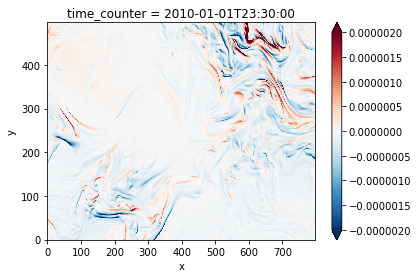

In [44]:
(ebf01*f[1:-1,1:-1]**-1*1e-3).plot(vmax=2e-6)

In [23]:
# alpha01 = xr.apply_ufunc(gsw.alpha, 
#                          ((SA01*xr.DataArray(e3t.data[:len(SA01.deptht)], dims='deptht')).where(SA01.deptht < MLD01[1:-1]).sum('deptht')
#                           * MLD01[1:-1]**-1).mean(['y','x']), 
#                          ((CT01*xr.DataArray(e3t.data[:len(CT01.deptht)], dims='deptht')).where(CT01.deptht < MLD01[1:-1]).sum('deptht')
#                           * MLD01[1:-1]**-1).mean(['y','x']), 0,
#                         dask='parallelized', output_dtypes=['float',])
alpha = gsw.alpha(((SA01*xr.DataArray(e3t.data[:len(SA01.deptht)], dims='deptht')).where(SA01.deptht < MLD01).sum('deptht')
                     * MLD01**-1 * At).sum(['y','x']) * At.sum(['y','x'])**-1, 
                    ((CT01*xr.DataArray(e3t.data[:len(CT01.deptht)], dims='deptht')).where(CT01.deptht < MLD01).sum('deptht')
                     * MLD01**-1 * At).sum(['y','x']) * At.sum(['y','x'])**-1, 0,)

# Bdot01 = (g*((alpha01*xr.DataArray(e3t.data[:len(alpha01.deptht)], 
#                                    dims='deptht')).where(alpha01.deptht < MLD01).sum('deptht')
#           * MLD01**-1)*Tflx01*rhoConst**-1*Cp**-1).compute()
Bdot01 = (g*alpha*Tflx01*rhoConst**-1*Cp**-1).compute()
Bdot01

<xarray.DataArray 'qt_oce' (y: 500, x: 800)>
array([[-1.8311871e-07, -1.9034329e-07, -1.9620083e-07, ...,
        -2.9860894e-07, -2.9840552e-07, -2.9873249e-07],
       [-1.7813475e-07, -1.8666168e-07, -1.9351907e-07, ...,
        -2.9903634e-07, -2.9862022e-07, -2.9885115e-07],
       [-1.7269458e-07, -1.8260594e-07, -1.9051106e-07, ...,
        -2.9950414e-07, -2.9888270e-07, -2.9899707e-07],
       ...,
       [-2.6687999e-07, -2.6761714e-07, -2.6897052e-07, ...,
        -2.7083635e-07, -2.7029253e-07, -2.6795229e-07],
       [-2.6839407e-07, -2.6931548e-07, -2.7075336e-07, ...,
        -2.6532965e-07, -2.6559576e-07, -2.6437243e-07],
       [-2.7004563e-07, -2.7097809e-07, -2.7165032e-07, ...,
        -2.5940321e-07, -2.6064563e-07, -2.6068113e-07]], dtype=float32)
Coordinates:
    nav_lat        (y, x) float32 36.69535 36.695553 ... 43.21733 43.217693
    nav_lon        (y, x) float32 -59.623344 -59.606667 ... -46.447792
    time_centered  datetime64[ns] 2010-01-01T23:30:00
    time_counter   datetime64[ns] 2010-01-01T23:30:00
Dimensions without coordinates: y, x

In [23]:
gradb201 = bx[:,1:-1]**2 + by[:,:,1:-1]**2
gradT201 = tx[:,1:-1]**2 + ty[:,:,1:-1]**2
gradS201 = sx[:,1:-1]**2 + sy[:,:,1:-1]**2
gradTS01 = (tx*sx)[:,1:-1] + (ty*sy)[:,:,1:-1]
gradTS01

<xarray.DataArray (deptht: 95, y: 498, x: 798)>
dask.array<add, shape=(95, 498, 798), dtype=float64, chunksize=(4, 498, 798), chunktype=numpy.ndarray>
Coordinates:
  * deptht        (deptht) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
    time_counter  datetime64[ns] 2010-01-01T23:30:00
Dimensions without coordinates: y, x

/scratch/cnt0024/hmg2840/tuchida/condapack/lib/python3.7/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


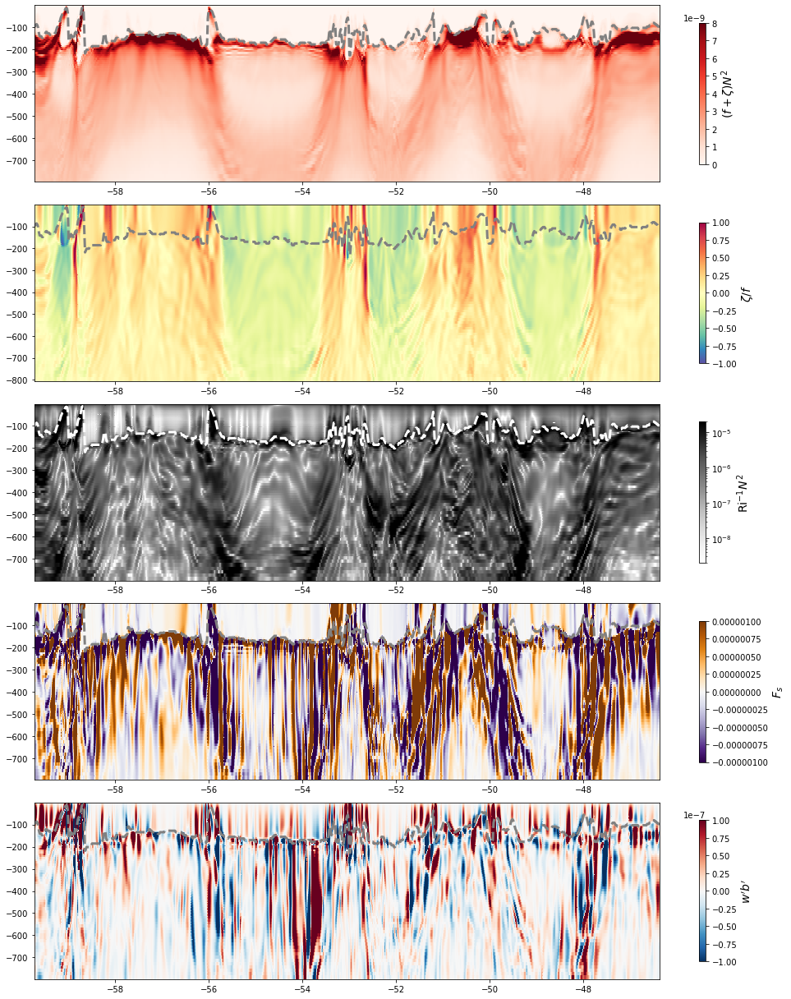

In [22]:
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(14,17))
fig.set_tight_layout(True)

im3 = ax3.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -Ri01_1.depthw,
                     (Ri01_1*N201[:,:-1,:-1])[:,300], cmap='Greys', norm=clr.LogNorm(vmin=2e-9, vmax=2e-5), rasterized=True)
ax3.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='w', ls='--', lw=3)
im1 = ax1.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -N201.depthw,
                     (N201[:,1:-1,1:-1]*
                     (f[1:-1,1:-1]+zeta01).chunk({'deptht':-1}).interp({'deptht':N201.depthw.data}).transpose('deptht','y','x').data)[:,299], 
                     cmap='Reds', vmin=0., vmax=8e-9, rasterized=True)
ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)
im4 = ax4.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -normFs01.depthw,
                     Fs01[:,299], cmap='PuOr_r', vmin=-1e-6, vmax=1e-6, rasterized=True)
ax4.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)
im5 = ax5.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -wsbs01.depthw,
                     wsbs01[:,300], cmap='RdBu_r', vmin=-1e-7, vmax=1e-7, rasterized=True)
ax5.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)
im2 = ax2.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -zeta01.deptht,
                     (zeta01*f[1:-1,1:-1]**-1)[:,300], cmap='Spectral_r', vmin=-1, vmax=1, rasterized=True)
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)

ax1.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax2.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax3.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax4.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax5.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])

cb1 = fig.colorbar(im1, ax=ax1, shrink=.8)
cb2 = fig.colorbar(im2, ax=ax2, shrink=.8)
cb3 = fig.colorbar(im3, ax=ax3, shrink=.8)
cb4 = fig.colorbar(im4, ax=ax4, shrink=.8)
cb5 = fig.colorbar(im5, ax=ax5, shrink=.8)
cb3.set_label(r"Ri$^{-1}N^2$", fontsize=14)
cb1.set_label(r"$(f+\zeta)N^2$", fontsize=14)
cb4.set_label(r"$F_s$", fontsize=14)
cb5.set_label(r"$w'b'$", fontsize=14)
cb2.set_label(r"$\zeta/f$", fontsize=14)

plt.savefig(r"/scratch/cnt0024/hmg2840/tuchida/Figs/Vertical-profiles_Jan-01-2010_GulfStream.pdf")

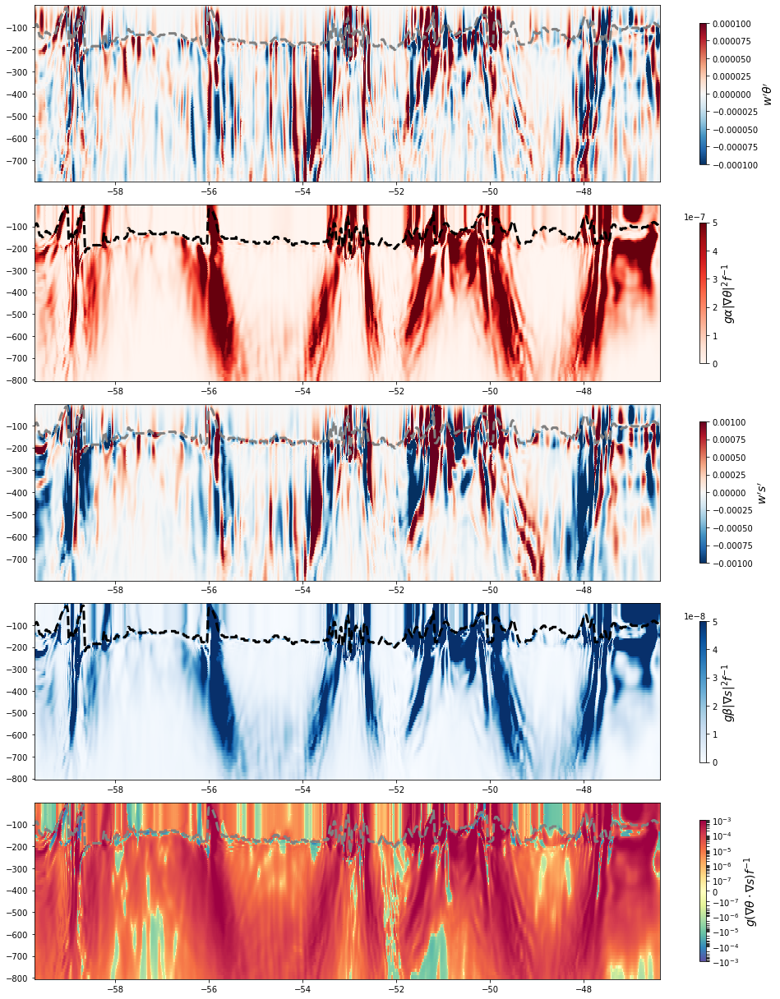

In [25]:
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(14,17))
fig.set_tight_layout(True)

im2 = ax2.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -CT01.deptht,
                     g*alpha01[:,300,1:-1]*gradT201[:,299]*f[300,1:-1]**-1, 
                     cmap='Reds', vmin=0, vmax=5e-7, rasterized=True)
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='k', ls='--', lw=3)
im3 = ax3.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -wsss01.depthw,
                     wsss01[:,300], cmap='RdBu_r', vmin=-1e-3, vmax=1e-3, rasterized=True)
ax3.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)
im4 = ax4.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -SA01.deptht,
                     g*beta01[:,300,1:-1]*gradS201[:,299]*f[300,1:-1]**-1, 
                     cmap='Blues', vmin=0, vmax=5e-8, rasterized=True)
ax4.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='k', ls='--', lw=3)
im1 = ax1.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -wsts01.depthw,
                     wsts01[:,300], cmap='RdBu_r', vmin=-1e-4, vmax=1e-4, rasterized=True)
ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)
im5 = ax5.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -CT01.deptht,
                     g*gradTS01[:,299]*f[300,1:-1]**-1, 
                     cmap='Spectral_r', norm=clr.SymLogNorm(linthresh=1e-7, vmin=-1e-3, vmax=1e-3), rasterized=True)
ax5.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)

ax1.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax2.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax3.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax4.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax5.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])

cb1 = fig.colorbar(im1, ax=ax1, shrink=.8)
cb2 = fig.colorbar(im2, ax=ax2, shrink=.8)
cb3 = fig.colorbar(im3, ax=ax3, shrink=.8)
cb4 = fig.colorbar(im4, ax=ax4, shrink=.8)
cb5 = fig.colorbar(im5, ax=ax5, shrink=.8)
cb3.set_label(r"$w's'$", fontsize=14)
cb5.set_label(r"$g (\nabla\theta\cdot\nabla s) f^{-1}$", fontsize=14)
cb4.set_label(r"$g\beta |\nabla s|^2 f^{-1}$", fontsize=14)
cb1.set_label(r"$w'\theta'$", fontsize=14)
cb2.set_label(r"$g\alpha|\nabla\theta|^2 f^{-1}$", fontsize=14)

plt.savefig(r"/scratch/cnt0024/hmg2840/tuchida/Figs/Vertical-profiles_T-s_Jan-01-2010_GulfStream.pdf")

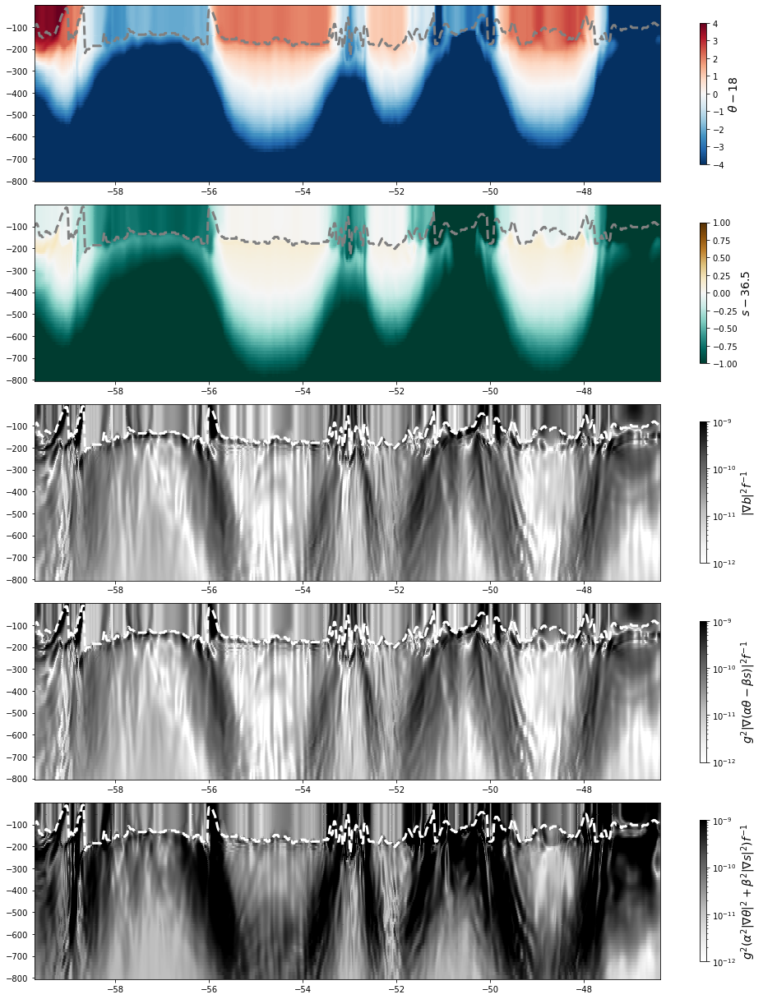

In [53]:
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(14,17))
fig.set_tight_layout(True)

im1 = ax1.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -CT01.deptht,
                     CT01[:,300]-18., vmax=4, vmin=-4, cmap='RdBu_r', rasterized=True)
ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)
im2 = ax2.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -SA01.deptht,
                     SA01[:,300]-36.5, vmin=-1., vmax=1., cmap='BrBG_r', rasterized=True)
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='grey', ls='--', lw=3)
im3 = ax3.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -CT01.deptht,
                     gradb201[:,299]*f[300,1:-1]**-1, 
                     cmap='Greys', norm=clr.LogNorm(vmin=1e-12, vmax=1e-9), rasterized=True)
ax3.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='w', ls='--', lw=3)
im4 = ax4.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -SA01.deptht,
                     g**2*(alpha01[:,1:-1,1:-1]**2*gradT201
                           + beta01[:,1:-1,1:-1]**2*gradS201
                           - 2*(alpha01*beta01)[:,1:-1,1:-1]*gradTS01)[:,299]*f[300,1:-1]**-1, 
                     cmap='Greys', norm=clr.LogNorm(vmin=1e-12, vmax=1e-9), rasterized=True)
ax4.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='w', ls='--', lw=3)
im5 = ax5.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -SA01.deptht,
                     g**2*(alpha01[:,1:-1,1:-1]**2*gradT201
                           + beta01[:,1:-1,1:-1]**2*gradS201)[:,299]*f[300,1:-1]**-1, 
                     cmap='Greys', norm=clr.LogNorm(vmin=1e-12, vmax=1e-9), rasterized=True)
ax5.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD01[300], c='w', ls='--', lw=3)

ax1.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax2.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax3.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax4.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax5.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])

cb1 = fig.colorbar(im1, ax=ax1, shrink=.8)
cb2 = fig.colorbar(im2, ax=ax2, shrink=.8)
cb3 = fig.colorbar(im3, ax=ax3, shrink=.8)
cb4 = fig.colorbar(im4, ax=ax4, shrink=.8)
cb5 = fig.colorbar(im5, ax=ax5, shrink=.8)
cb3.set_label(r"$|\nabla b|^2 f^{-1}$", fontsize=14)
cb4.set_label(r"$g^2|\nabla(\alpha\theta-\beta s)|^2 f^{-1}$", fontsize=14)
cb5.set_label(r"$g^2(\alpha^2|\nabla\theta|^2+\beta^2|\nabla s|^2) f^{-1}$", fontsize=14)
cb1.set_label(r"$\theta-18$", fontsize=14)
cb2.set_label(r"$s-36.5$", fontsize=14)

plt.savefig(r"/scratch/cnt0024/hmg2840/tuchida/Figs/Vertical-profiles_b_T-s_Jan-01-2010_GulfStream.pdf")

# Mar. 15, 2010

In [26]:
dsT = xr.open_dataset(op.join(xtra,'00896401-00950400/eNATL60-BLBT02X_1h_20100220_20100316_gridT_20100315-20100315.nc'),
                      chunks={'deptht':zchunk}
                     ).sel(deptht=slice(None,810))
dsS = xr.open_dataset(op.join(xtra,'00896401-00950400/eNATL60-BLBT02X_1h_20100220_20100316_gridS_20100315-20100315.nc'),
                      chunks={'deptht':zchunk}
                     ).sel(deptht=slice(None,810))

#         if i == days[0,0]:
maskT = dsmask.tmask[0].sel(y=slice(ys,ye),x=slice(xs,xe)
                           ).isel(z=slice(None,len(dsT.deptht)))

CT03 = dsT.votemper[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                         ).where(xr.DataArray(maskT.data, dims=['deptht','y','x']
                                             ) != 0.)
SA03 = dsS.vosaline[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                         ).where(xr.DataArray(maskT.data, dims=['deptht','y','x']
                                             ) != 0.)

alpha03 = xr.apply_ufunc(gsw.alpha, SA03, CT03, 0., dask='parallelized', output_dtypes=[float,])
beta03 = xr.apply_ufunc(gsw.beta, SA03, CT03, 0., dask='parallelized', output_dtypes=[float,])
rho03 = xr.apply_ufunc(gsw.sigma0, SA03, CT03, dask='parallelized', output_dtypes=[float,]) + 1e3
b03 = -g*(1.-rho03*1e-3)
rho03

<xarray.DataArray (deptht: 95, y: 500, x: 800)>
dask.array<add, shape=(95, 500, 800), dtype=float64, chunksize=(4, 500, 800), chunktype=numpy.ndarray>
Coordinates:
  * deptht        (deptht) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
    nav_lat       (y, x) float32 36.69535 36.695553 ... 43.21733 43.217693
    nav_lon       (y, x) float32 -59.623344 -59.606667 ... -46.464603 -46.447792
    time_counter  datetime64[ns] 2010-03-15T23:30:00
Dimensions without coordinates: y, x

In [27]:
dsU = xr.open_dataset(op.join(xtra,'00896401-00950400/eNATL60-BLBT02X_1h_20100220_20100316_gridU_20100315-20100315.nc'),
                      chunks={'depthu':zchunk}
                     ).sel(depthu=slice(None,810))
dsV = xr.open_dataset(op.join(xtra,'00896401-00950400/eNATL60-BLBT02X_1h_20100220_20100316_gridV_20100315-20100315.nc'),
                      chunks={'depthv':zchunk}
                     ).sel(depthv=slice(None,810))
dsW = xr.open_dataset(op.join(xtra,'00896401-00950400/eNATL60-BLBT02X_1h_20100220_20100316_gridW_20100315-20100315.nc'),
                      chunks={'depthw':zchunk}
                     ).sel(depthw=slice(None,810))

maskU = dsmask.umask[0].sel(y=slice(ys,ye),x=slice(xs,xe)
                           ).isel(z=slice(None,len(dsU.depthu)))
maskV = dsmask.vmask[0].sel(y=slice(ys,ye),x=slice(xs,xe)
                           ).isel(z=slice(None,len(dsV.depthv)))

u03 = dsU.vozocrtx[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                        ).where(xr.DataArray(maskU.data, dims=['depthu','y','x']
                                            ) != 0.)
v03 = dsV.vomecrty[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                        ).where(xr.DataArray(maskV.data, dims=['depthv','y','x']
                                            ) != 0.)
w03 = dsW.vovecrtz[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                        ).where(xr.DataArray(maskT.data, dims=['depthw','y','x']
                                            ) != 0.)
u03

<xarray.DataArray 'vozocrtx' (depthu: 95, y: 500, x: 800)>
dask.array<where, shape=(95, 500, 800), dtype=float32, chunksize=(4, 500, 800), chunktype=numpy.ndarray>
Coordinates:
  * depthu         (depthu) float64 0.4805 1.559 2.794 ... 774.7 790.2 805.8
    nav_lat        (y, x) float32 dask.array<chunksize=(500, 800), meta=np.ndarray>
    nav_lon        (y, x) float32 dask.array<chunksize=(500, 800), meta=np.ndarray>
    time_centered  datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
    time_counter   datetime64[ns] 2010-03-15T23:30:00
Dimensions without coordinates: y, x
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           ocean current along i-axis
    units:               m/s
    online_operation:    average
    interval_operation:  40 s
    interval_write:      1 h
    cell_methods:        time: mean (interval: 40 s)

In [46]:
taux03 = xr.open_dataset(op.join(xtra,'00896401-00950400/eNATL60-BLBT02X_1h_20100220_20100316_gridU-2D_20100315-20100315.nc'),
                       chunks={'time_counter':1}
                      ).sozotaux[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                                        ).where(xr.DataArray(maskU[0].data, dims=['y','x']
                                                            ) != 0.)
tauy03 = xr.open_dataset(op.join(xtra,'00896401-00950400/eNATL60-BLBT02X_1h_20100220_20100316_gridV-2D_20100315-20100315.nc'),
                       chunks={'time_counter':1}
                      ).sometauy[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                                        ).where(xr.DataArray(maskV[0].data, dims=['y','x']
                                                            ) != 0.)
dflx = xr.open_dataset(op.join(xtra,'00896401-00950400/eNATL60-BLBT02X_1h_20100220_20100316_flxT_20100315-20100315.nc'),
                       chunks={'time_counter':1}
                      )
Tflx03 = dflx.qt_oce[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                            ).where(xr.DataArray(maskT[0].data, dims=['y','x']
                                                ) != 0.)
Sflx03 = dflx.sowaflup[-1].sel(y=slice(ys,ye),x=slice(xs,xe)
                              ).where(xr.DataArray(maskT[0].data, dims=['y','x']
                                                  ) != 0.)
taux03

<xarray.DataArray 'sozotaux' (y: 500, x: 800)>
dask.array<where, shape=(500, 800), dtype=float32, chunksize=(500, 800), chunktype=numpy.ndarray>
Coordinates:
    nav_lat        (y, x) float32 dask.array<chunksize=(500, 800), meta=np.ndarray>
    nav_lon        (y, x) float32 dask.array<chunksize=(500, 800), meta=np.ndarray>
    time_centered  datetime64[ns] dask.array<chunksize=(), meta=np.ndarray>
    time_counter   datetime64[ns] 2010-03-15T23:30:00
Dimensions without coordinates: y, x
Attributes:
    standard_name:       surface_downward_x_stress
    long_name:           Wind Stress along i-axis
    units:               N/m2
    online_operation:    average
    interval_operation:  40 s
    interval_write:      1 h
    cell_methods:        time: mean (interval: 40 s)

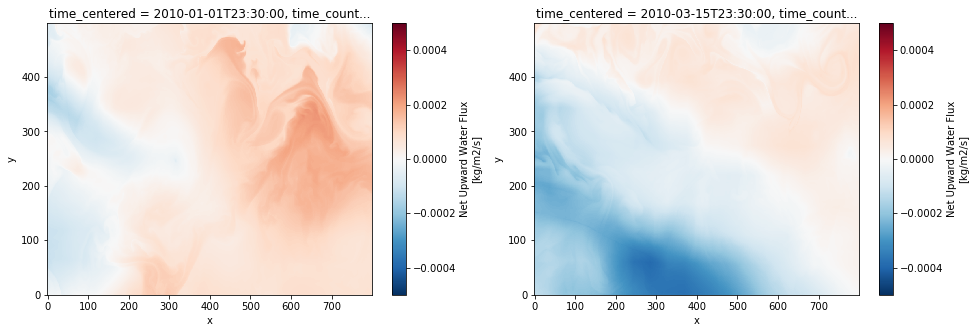

In [47]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
Sflx01.plot(ax=ax1, vmax=5e-4)
Sflx03.plot(ax=ax2, vmax=5e-4)

In [28]:
# alpha03 = xr.apply_ufunc(gsw.alpha, SA, CT, 0,
#                         dask='parallelized', output_dtypes=['float',])

p = xr.apply_ufunc(gsw.p_from_z, -dsT.deptht, dsmask.nav_lat.sel(y=slice(ys,ye),x=slice(xs,xe)),
                  dask='parallelized', output_dtypes=['float',])
N2, pN2 = gsw.Nsquared(SA03, CT03, p, dsmask.nav_lat.sel(y=slice(ys,ye),x=slice(xs,xe)))
N203 = xr.DataArray(N2, dims=['depthw','y','x'], coords={'depthw':dsW.depthw[1:].data})
uz = u03.diff('depthu')*xr.DataArray(e3w[1:len(u03.depthu)].data, dims='depthu')**-1
vz = v03.diff('depthv')*xr.DataArray(e3w[1:len(v03.depthv)].data, dims='depthv')**-1
Ri03_1 = (N203[:,:-1,:-1]**-1 * ((.5*(uz.data[:,:-1,1:]+uz.data[:,:-1,:-1]))**2 
                            + (.5*(vz.data[:,1:,:-1]+vz.data[:,:-1,:-1]))**2)
         ).compute()
z10 = 6
nMLD = z10 + np.abs((rho03.isel(deptht=slice(z10,None))
                     - rho03.isel(deptht=z10)
                    )-0.03).argmin(dim='deptht').compute()
MLD03 = (xr.ones_like(rho03) * rho03.deptht
      )[{'deptht':nMLD}].load()

# alpha = gsw.alpha(((SA03*xr.DataArray(e3t.data[:len(SA03.deptht)], dims='deptht')).where(SA03.deptht < MLD03).sum('deptht')
#                      * MLD03**-1 * At).sum(['y','x']) * At.sum(['y','x'])**-1, 
#                     ((CT03*xr.DataArray(e3t.data[:len(CT03.deptht)], dims='deptht')).where(CT03.deptht < MLD03).sum('deptht')
#                      * MLD03**-1 * At).sum(['y','x']) * At.sum(['y','x'])**-1, 0)
# # Bdot03 = (g*((alpha03*xr.DataArray(e3t.data[:len(alpha03.deptht)], 
# #                                    dims='deptht')).where(alpha03.deptht < MLD03).sum('deptht')
# #          * MLD03**-1)*Tflx03*rhoConst**-1*Cp**-1).compute()
# Bdot03 = (g*alpha*Tflx03*rhoConst**-1*Cp**-1).compute()

vx = (v03*e2v).diff('x')
vx = .5*(vx[:,1:]+vx[:,:-1])
uy = (u03*e1u).diff('y')
uy = .5*(uy[:,:,1:]+uy[:,:,:-1])

vx = .5*(vx[:,1:]+vx[:,:-1])
vx = .5*(vx[:,:,1:]+vx[:,:,:-1])
uy = .5*(uy[:,1:]+uy[:,:-1])
uy = .5*(uy[:,:,1:]+uy[:,:,:-1])
zeta03 = (xr.DataArray(vx.data - uy.data, dims=['deptht','y','x'],
                   coords={'deptht':CT03.deptht.data}) * At[1:-1,1:-1]**-1
         ).compute()


bx = (b03*e2t).diff('x') * Au[:,1:]**-1
by = (b03*e1t).diff('y') * Av[1:]**-1
bx = .5*(bx[:,:,1:]+bx[:,:,:-1])
by = .5*(by[:,1:]+by[:,:-1])
tx = (CT03*e2t).diff('x') * Au[:,1:]**-1
ty = (CT03*e1t).diff('y') * Av[1:]**-1
tx = .5*(tx[:,:,1:]+tx[:,:,:-1])
ty = .5*(ty[:,1:]+ty[:,:-1])
sx = (SA03*e2t).diff('x') * Au[:,1:]**-1
sy = (SA03*e1t).diff('y') * Av[1:]**-1
sx = .5*(sx[:,:,1:]+sx[:,:,:-1])
sy = .5*(sy[:,1:]+sy[:,:-1])
gradb203 = bx[:,1:-1]**2 + by[:,:,1:-1]**2
gradT203 = tx[:,1:-1]**2 + ty[:,:,1:-1]**2
gradS203 = sx[:,1:-1]**2 + sy[:,:,1:-1]**2
gradTS03 = (tx*sx)[:,1:-1] + (ty*sy)[:,:,1:-1]

# ebf2 = ((by*xr.DataArray(e3t.data[:len(by.deptht)], dims='deptht')).where(by.deptht < MLD03[1:-1]).sum('deptht')
#         * MLD03[1:-1]**-1)[:,:-1] * .5*(taux03[:,1:]+taux03[:,:-1])[1:-1]
# ebf1 = ((bx*xr.DataArray(e3t.data[:len(bx.deptht)], dims='deptht')).where(bx.deptht < MLD03[:,1:-1]).sum('deptht')
#         * MLD03[:,1:-1]**-1)[:-1] * .5*(tauy03[1:]+tauy03[:-1])[:,1:-1]
# ebf03 = ebf1[1:] - ebf2[:,1:]

ux = (u03*e2u).diff('x') * At[:,:-1]
# ux = .5*(ux[:,:,1:]+ux[:,:,:-1])
vy = (v03*e1v).diff('y') * At[:-1]
# vy = .5*(vy[:,1:]+vy[:,:-1])
wx = (w03*e2t).diff('x') * Au[:,1:]
wy = (w03*e1t).diff('y') * Av[1:]
wx = .5*(wx[:,:,1:]+wx[:,:,:-1])
wy = .5*(wy[:,1:]+wy[:,:-1])
# bz = xr.DataArray((-b03.diff('deptht') * xr.DataArray(e3w[1:len(dsW.depthw)],dims='deptht')**-1).data,
#                  dims=['depthw','y','x'],
#                  coords={'depthw':dsW.depthw[1:].data})
bz = N203.copy()

uxbx = (bx*ux.data[:,:,:-1])[:,1:-1]
vxby = by[:,:,1:-1]*(vx.data*At[1:-1,1:-1]**-1)
wxbz = (wx*bz[:,:,1:-1])[:,1:-1]
q1 = -(xr.DataArray((uxbx + vxby).chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                   dims=['depthw','y','x'],
                   coords={'depthw':dsW.depthw[1:].data}) + wxbz)
       
uybx = bx[:,1:-1]*(uy.data*At[1:-1,1:-1]**-1)
vyby = (by*vy.data[:,:-1])[:,:,1:-1]
wybz = (wy*bz[:,1:-1])[:,:,1:-1]
q2 = -(xr.DataArray((uybx + vyby).chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                   dims=['depthw','y','x'],
                   coords={'depthw':dsW.depthw.data[1:]}) + wybz)

Fs03 = (q1*xr.DataArray(bx[:,1:-1].chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                     dims=['depthw','y','x'],
                     coords={'depthw':dsW.depthw[1:].data}) 
      + q2*xr.DataArray(by[:,:,1:-1].chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                       dims=['depthw','y','x'],
                       coords={'depthw':dsW.depthw[1:].data})
       ).compute()
normFs03 = (Fs03 * np.sqrt(xr.DataArray(bx[:,1:-1].chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                                   dims=['depthw','y','x'],
                                   coords={'depthw':dsW.depthw[1:].data})**2
                      + xr.DataArray(by[:,:,1:-1].chunk({'deptht':-1}).interp({'deptht':dsW.depthw.data[1:]}).data,
                                     dims=['depthw','y','x'],
                                     coords={'depthw':dsW.depthw[1:].data})**2)**-1
           ).compute()

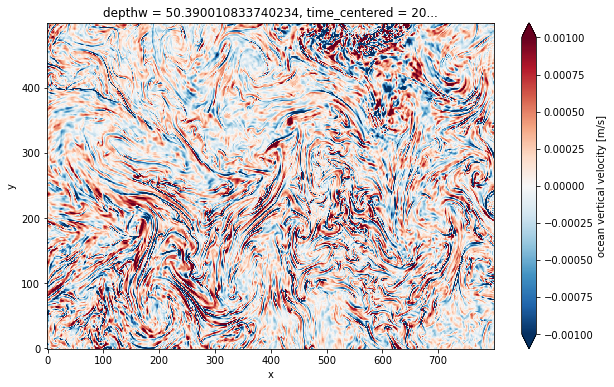

In [38]:
w03[20].plot(vmax=1e-3, figsize=(10,6))

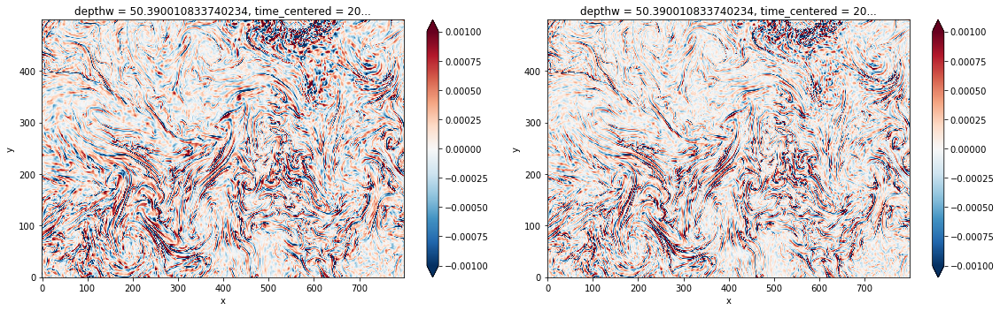

In [53]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
fig.set_tight_layout(True)
filt(w03.chunk({'depthw':1}), area=At, m=50, cut=40)[20].plot(ax=ax1, vmax=1e-3)
filt(w03.chunk({'depthw':1}), area=At)[20].plot(ax=ax2, vmax=1e-3)

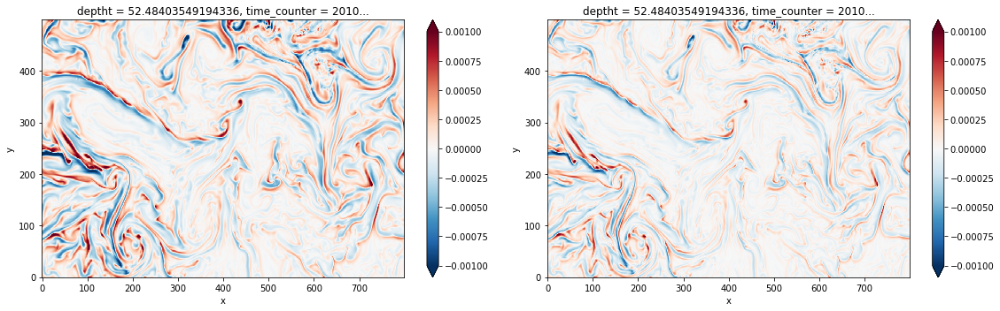

In [57]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
fig.set_tight_layout(True)
filt(b03.chunk({'deptht':1}), area=At, m=40, cut=30)[20].plot(ax=ax1, vmax=1e-3)
filt(b03.chunk({'deptht':1}), area=At)[20].plot(ax=ax2, vmax=1e-3)

In [29]:
ws03 = filt(w03.chunk({'depthw':1}), area=At, m=40, cut=30)
bs03 = filt(b03.chunk({'deptht':1}), area=At, m=40, cut=30)
ts03 = filt(CT03.chunk({'deptht':1}), area=At, m=40, cut=30)
ss03 = filt(SA03.chunk({'deptht':1}), area=At, m=40, cut=30)

wsbs03 = (ws03.isel(depthw=slice(1,None)) 
         * bs03.chunk({'deptht':-1}).interp({'deptht':dsW.depthw.isel(depthw=slice(1,None)).data},
                                           method='linear').data
         ).compute()
wb03 = (w03.isel(depthw=slice(1,None))
       * b03.chunk({'deptht':-1}).interp({'deptht':w03.depthw.isel(depthw=slice(1,None)).data},
                                        method='linear').data
       ).compute()

wsts03 = (ws03.isel(depthw=slice(1,None)) 
         * ts03.chunk({'deptht':-1}).interp({'deptht':dsW.depthw.isel(depthw=slice(1,None)).data},
                                           method='linear').data
         ).compute()
wt03 = (w03.isel(depthw=slice(1,None))
       * CT03.chunk({'deptht':-1}).interp({'deptht':w03.depthw.isel(depthw=slice(1,None)).data},
                                        method='linear').data
       ).compute()

wsss03 = (ws03.isel(depthw=slice(1,None)) 
         * ss03.chunk({'deptht':-1}).interp({'deptht':dsW.depthw.isel(depthw=slice(1,None)).data},
                                           method='linear').data
         ).compute()
ws03 = (w03.isel(depthw=slice(1,None))
       * SA03.chunk({'deptht':-1}).interp({'deptht':w03.depthw.isel(depthw=slice(1,None)).data},
                                        method='linear').data
       ).compute()
# wb03

distributed.scheduler - ERROR - Couldn't gather keys {"('truediv-3910785907abf2052e05b244ab2baed6', 0, 0, 0)": []} state: ['waiting'] workers: []
NoneType: None
distributed.scheduler - ERROR - Workers don't have promised key: [], ('truediv-3910785907abf2052e05b244ab2baed6', 0, 0, 0)
NoneType: None


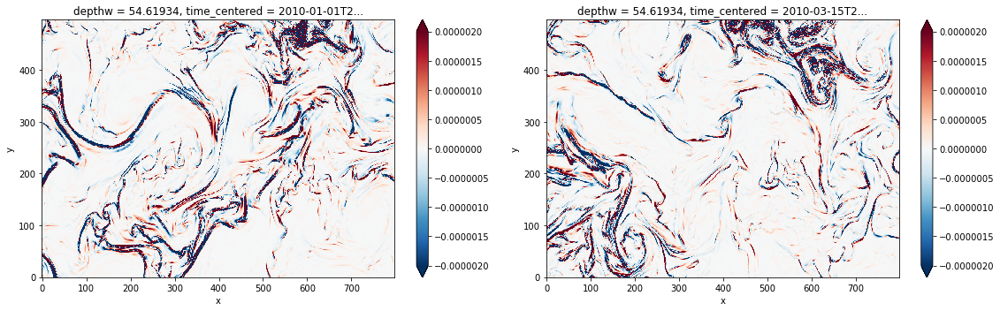

In [68]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
fig.set_tight_layout(True)
Fs01[20].plot(ax=ax1, vmax=2e-6)
Fs03[20].plot(ax=ax2, vmax=2e-6)

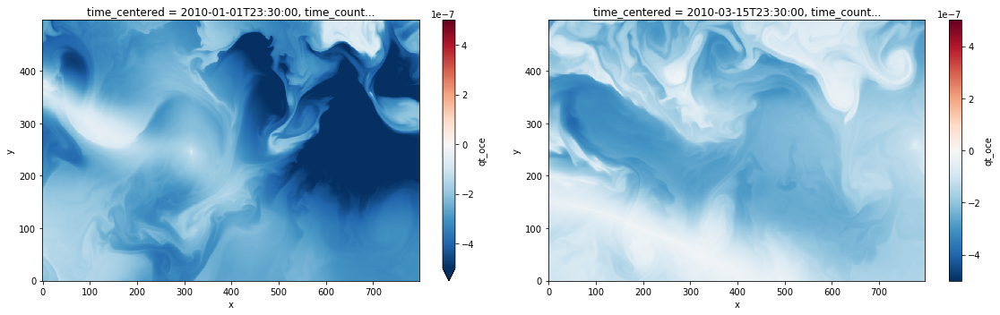

In [41]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
fig.set_tight_layout(True)
(Bdot01[1:-1,1:-1]).plot(ax=ax1, vmax=5e-7)
(Bdot03[1:-1,1:-1]).plot(ax=ax2, vmax=5e-7)

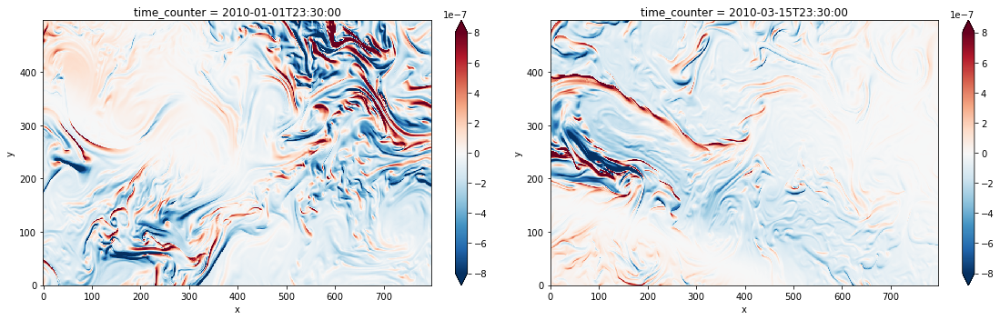

In [59]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
fig.set_tight_layout(True)
(ebf01*f[1:-1,1:-1]**-1*1e-3).plot(ax=ax1, vmax=8e-7)
(ebf03*f[1:-1,1:-1]**-1*1e-3).plot(ax=ax2, vmax=8e-7)

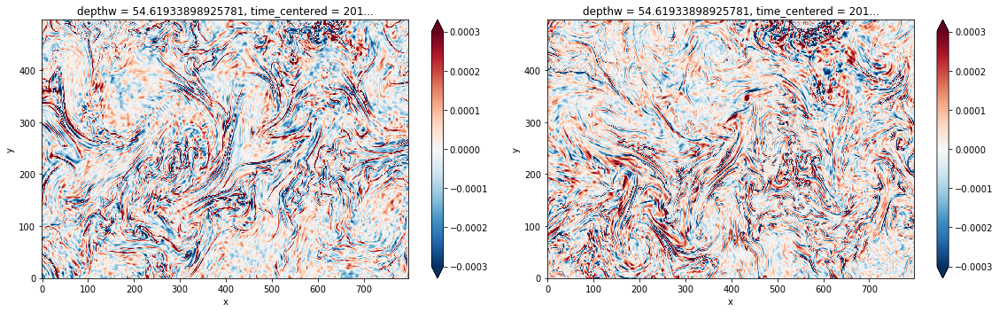

In [58]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
fig.set_tight_layout(True)
wb01[20,1:-1,1:-1].plot(ax=ax1, vmax=3e-4)
wb03[20,1:-1,1:-1].plot(ax=ax2, vmax=3e-4)

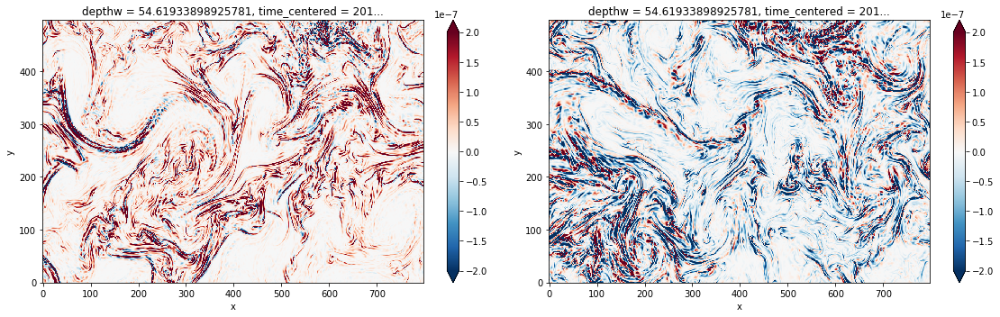

In [52]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
fig.set_tight_layout(True)
wsbs01[20,1:-1,1:-1].plot(ax=ax1, vmax=2e-7)
wsbs03[20,1:-1,1:-1].plot(ax=ax2, vmax=2e-7)

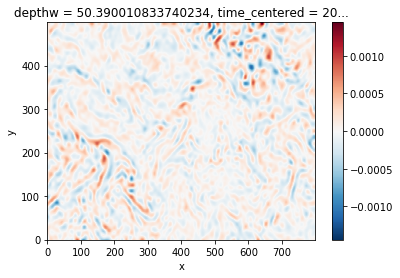

In [76]:
(w03 - ws03)[20].plot()

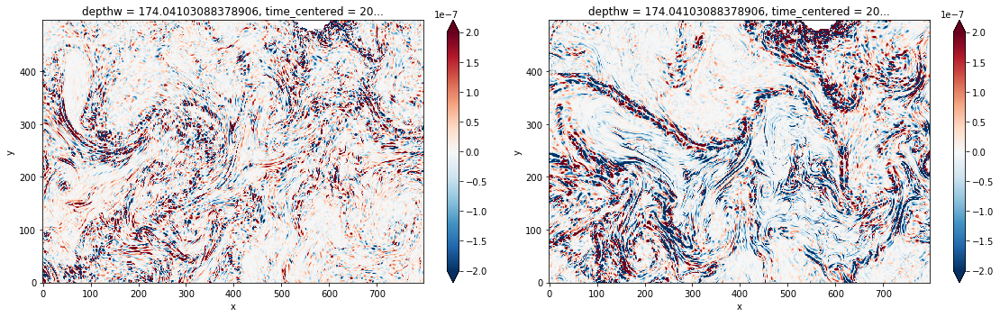

In [60]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
fig.set_tight_layout(True)
wsbs01[40,1:-1,1:-1].plot(ax=ax1, vmax=2e-7)
wsbs03[40,1:-1,1:-1].plot(ax=ax2, vmax=2e-7)

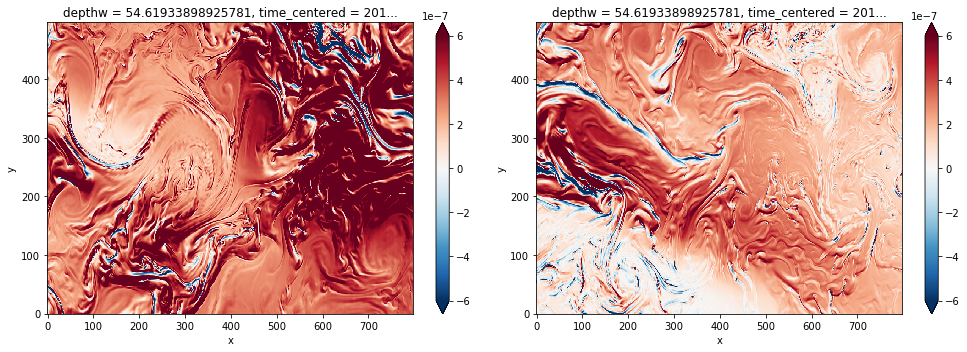

In [44]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14,5))
fig.set_tight_layout(True)
(wsbs01[20,1:-1,1:-1]
 - (Bdot01[1:-1,1:-1]+ebf01*f[1:-1,1:-1]**-1*1e-3)).plot(ax=ax1, vmax=6e-7)
(wsbs03[20,1:-1,1:-1]
 - (Bdot03[1:-1,1:-1]+ebf03*f[1:-1,1:-1]**-1*1e-3)).plot(ax=ax2, vmax=6e-7)

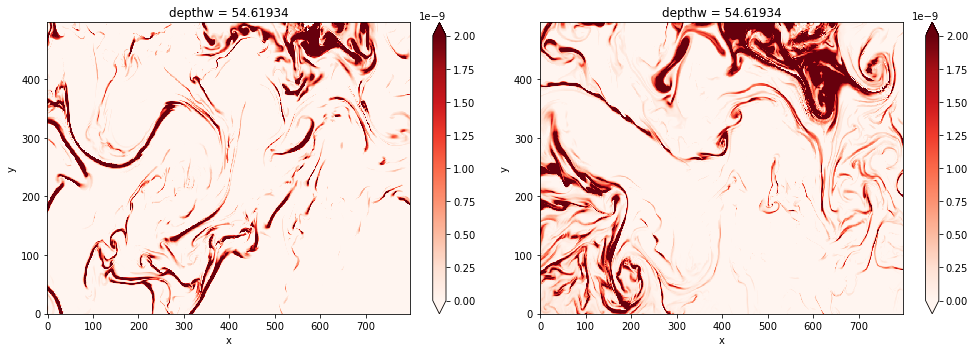

In [42]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14,5))
fig.set_tight_layout(True)

((N201[:,1:-1,1:-1]*
 (f[1:-1,1:-1]+zeta01).chunk({'deptht':-1}).interp({'deptht':N201.depthw.data}).transpose('deptht','y','x').data)
)[20].plot(ax=ax1, vmax=2e-9, vmin=0., cmap='Reds')

((N203[:,1:-1,1:-1]*
 (f[1:-1,1:-1]+zeta03).chunk({'deptht':-1}).interp({'deptht':N203.depthw.data}).transpose('deptht','y','x').data)
)[20].plot(ax=ax2, vmax=2e-9, vmin=0., cmap='Reds')

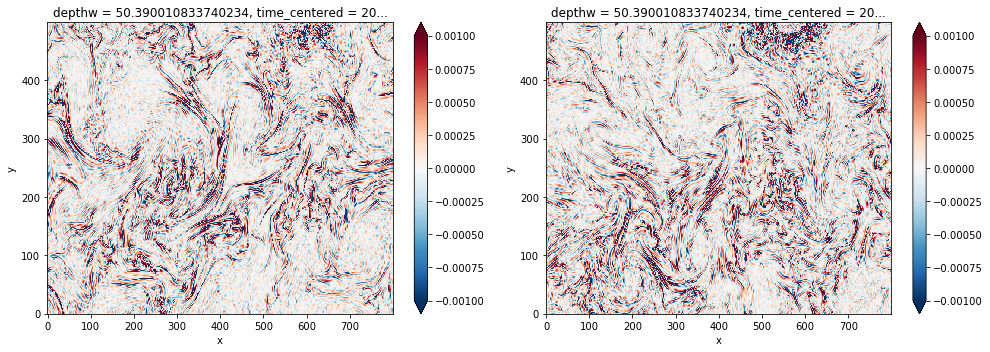

In [77]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14,5))
fig.set_tight_layout(True)
ws01[20].plot(ax=ax1, vmax=1e-3)
ws03[20].plot(ax=ax2, vmax=1e-3)

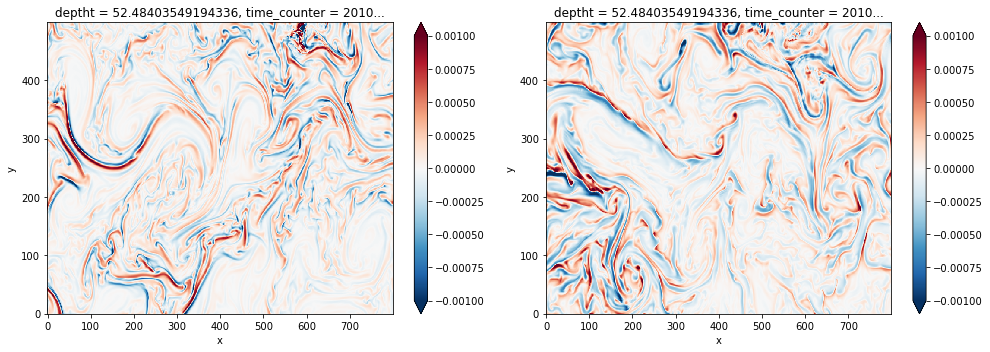

In [61]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14,5))
fig.set_tight_layout(True)
bs01[20].plot(ax=ax1, vmax=1e-3)
bs03[20].plot(ax=ax2, vmax=1e-3)

/scratch/cnt0024/hmg2840/tuchida/condapack/lib/python3.7/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


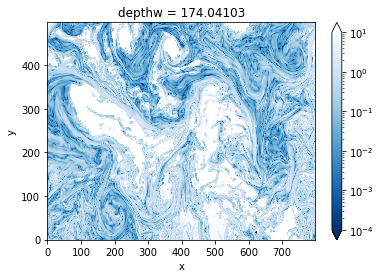

In [62]:
Ri03_1[40].plot(cmap='Blues_r',norm=clr.LogNorm(vmax=1e1, vmin=1e-4))

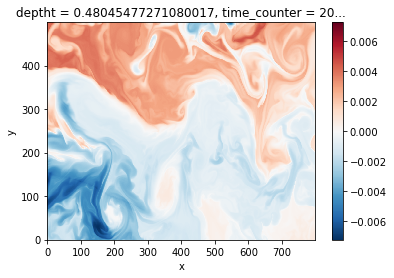

In [64]:
(b03[0]-b03[0].mean()).plot()

/scratch/cnt0024/hmg2840/tuchida/condapack/lib/python3.7/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


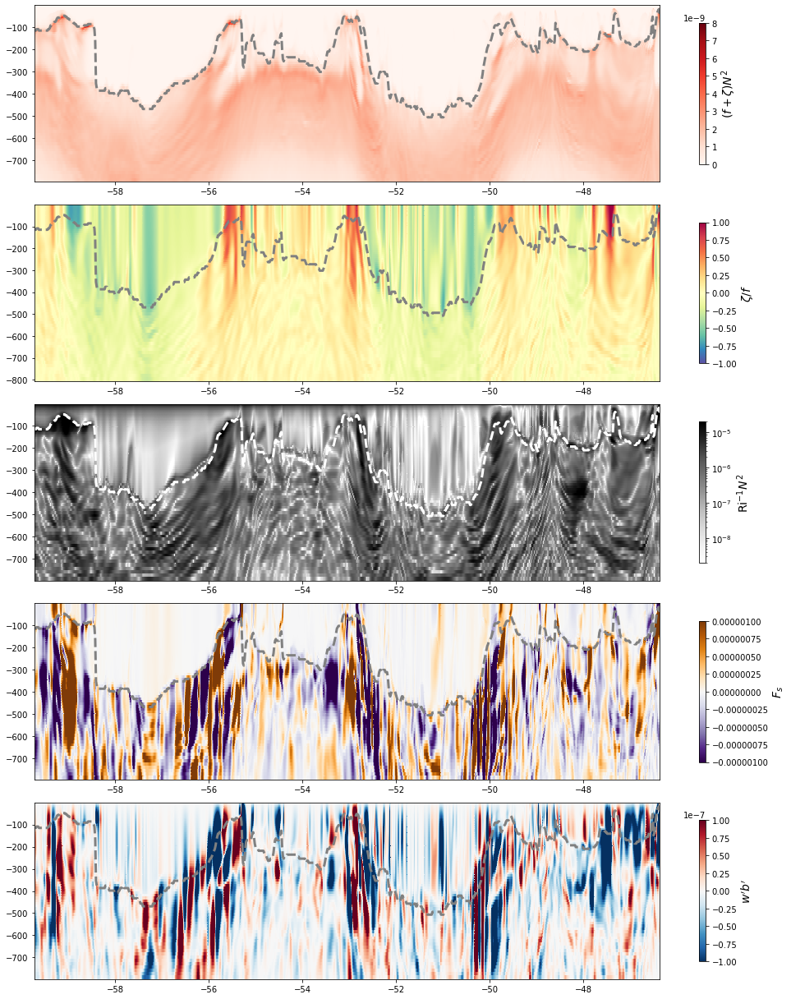

In [35]:
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(14,17))
fig.set_tight_layout(True)
# ax6 = ax5.twinx()

im3 = ax3.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -Ri03_1.depthw,
                     (Ri03_1*N203[:,:-1,:-1])[:,300], cmap='Greys', norm=clr.LogNorm(vmin=2e-9, vmax=2e-5), rasterized=True)
ax3.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='w', ls='--', lw=3)
im1 = ax1.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -N203.depthw,
                     (N203[:,1:-1,1:-1]*
                     (f[1:-1,1:-1]+zeta03).chunk({'deptht':-1}).interp({'deptht':N203.depthw.data}).transpose('deptht','y','x').data)[:,299], 
                     cmap='Reds', vmin=0., vmax=8e-9, rasterized=True)
ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)
im4 = ax4.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -normFs03.depthw,
                     Fs03[:,299], cmap='PuOr_r', vmin=-1e-6, vmax=1e-6, rasterized=True)
ax4.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)
im5 = ax5.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -wsbs03.depthw,
                     wsbs03[:,300], cmap='RdBu_r', vmin=-1e-7, vmax=1e-7, rasterized=True)
ax5.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)
im2 = ax2.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -zeta03.deptht,
                     (zeta03*f[1:-1,1:-1]**-1)[:,300], cmap='Spectral_r', vmin=-1, vmax=1, rasterized=True)
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)

# ax6.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], Bdot03[300], c='k', ls='-', lw=3)

ax1.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax2.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax3.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax4.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax5.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])

cb1 = fig.colorbar(im1, ax=ax1, shrink=.8)
cb2 = fig.colorbar(im2, ax=ax2, shrink=.8)
cb3 = fig.colorbar(im3, ax=ax3, shrink=.8)
cb4 = fig.colorbar(im4, ax=ax4, shrink=.8)
cb5 = fig.colorbar(im5, ax=ax5, shrink=.8)
cb3.set_label(r"Ri$^{-1}N^2$", fontsize=14)
cb1.set_label(r"$(f+\zeta)N^2$", fontsize=14)
cb4.set_label(r"$F_s$", fontsize=14)
cb5.set_label(r"$w'b'$", fontsize=14)
cb2.set_label(r"$\zeta/f$", fontsize=14)

plt.savefig(r"/scratch/cnt0024/hmg2840/tuchida/Figs/Vertical-profiles_Mar-15-2010_GulfStream.pdf")

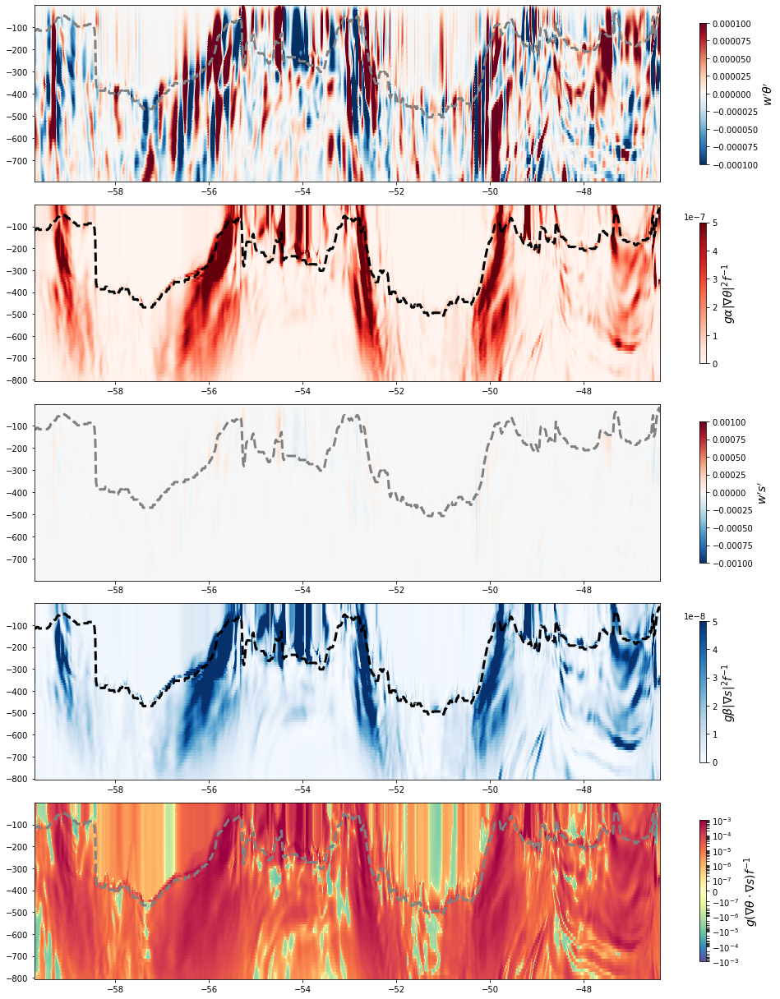

In [30]:
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(14,17))
fig.set_tight_layout(True)

im2 = ax2.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -CT03.deptht,
                     g*alpha03[:,300,1:-1]*gradT203[:,299]*f[300,1:-1]**-1, 
                     cmap='Reds', vmin=0, vmax=5e-7, rasterized=True)
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='k', ls='--', lw=3)
im3 = ax3.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -wsss03.depthw,
                     wsss03[:,300], cmap='RdBu_r', vmin=-1e-3, vmax=1e-3, rasterized=True)
ax3.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)
im4 = ax4.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -SA03.deptht,
                     g*beta03[:,300,1:-1]*gradS203[:,299]*f[300,1:-1]**-1, 
                     cmap='Blues', vmin=0, vmax=5e-8, rasterized=True)
ax4.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='k', ls='--', lw=3)
im1 = ax1.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -wsts03.depthw,
                     wsts03[:,300], cmap='RdBu_r', vmin=-1e-4, vmax=1e-4, rasterized=True)
ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)
im5 = ax5.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -CT03.deptht,
                     g*gradTS03[:,299]*f[300,1:-1]**-1, 
                     cmap='Spectral_r', norm=clr.SymLogNorm(linthresh=1e-7, vmin=-1e-3, vmax=1e-3), rasterized=True)
ax5.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)

ax1.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax2.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax3.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax4.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax5.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])

cb1 = fig.colorbar(im1, ax=ax1, shrink=.8)
cb2 = fig.colorbar(im2, ax=ax2, shrink=.8)
cb3 = fig.colorbar(im3, ax=ax3, shrink=.8)
cb4 = fig.colorbar(im4, ax=ax4, shrink=.8)
cb5 = fig.colorbar(im5, ax=ax5, shrink=.8)
cb3.set_label(r"$w's'$", fontsize=14)
cb5.set_label(r"$g (\nabla\theta\cdot\nabla s) f^{-1}$", fontsize=14)
cb4.set_label(r"$g\beta |\nabla s|^2 f^{-1}$", fontsize=14)
cb1.set_label(r"$w'\theta'$", fontsize=14)
cb2.set_label(r"$g\alpha|\nabla\theta|^2 f^{-1}$", fontsize=14)

plt.savefig(r"/scratch/cnt0024/hmg2840/tuchida/Figs/Vertical-profiles_T-s_Mar-15-2010_GulfStream.pdf")

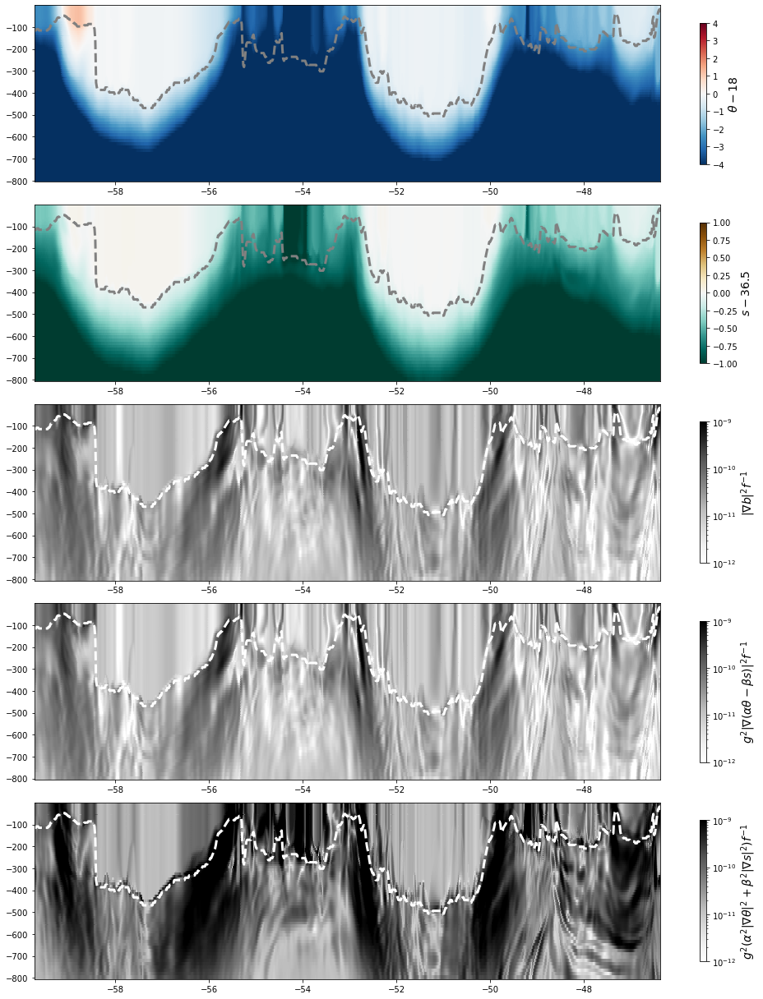

In [52]:
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(nrows=5, ncols=1, figsize=(14,17))
fig.set_tight_layout(True)

im1 = ax1.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -CT03.deptht,
                     CT03[:,300]-18, vmin=-4, vmax=4, cmap='RdBu_r', rasterized=True)
ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)
im2 = ax2.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -SA03.deptht,
                     SA03[:,300]-36.5, vmin=-1, vmax=1, cmap='BrBG_r', rasterized=True)
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)
im3 = ax3.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -CT03.deptht,
                     gradb203[:,299]*f[300,1:-1]**-1, 
                     cmap='Greys', norm=clr.LogNorm(vmin=1e-12, vmax=1e-9), rasterized=True)
ax3.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='w', ls='--', lw=3)
im4 = ax4.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -SA03.deptht,
                     g**2*(alpha03[:,1:-1,1:-1]**2*gradT203
                           + beta03[:,1:-1,1:-1]**2*gradS203
                           - 2*(alpha03*beta03)[:,1:-1,1:-1]*gradTS03)[:,299]*f[300,1:-1]**-1, 
                     cmap='Greys', norm=clr.LogNorm(vmin=1e-12, vmax=1e-9), rasterized=True)
ax4.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='w', ls='--', lw=3)
im5 = ax5.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1], -SA03.deptht,
                     g**2*(alpha03[:,1:-1,1:-1]**2*gradT203
                           + beta03[:,1:-1,1:-1]**2*gradS203)[:,299]*f[300,1:-1]**-1, 
                     cmap='Greys', norm=clr.LogNorm(vmin=1e-12, vmax=1e-9), rasterized=True)
ax5.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='w', ls='--', lw=3)

ax1.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax2.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax3.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax4.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])
ax5.set_xlim([dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].min(), 
             dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300].max()])

cb1 = fig.colorbar(im1, ax=ax1, shrink=.8)
cb2 = fig.colorbar(im2, ax=ax2, shrink=.8)
cb3 = fig.colorbar(im3, ax=ax3, shrink=.8)
cb4 = fig.colorbar(im4, ax=ax4, shrink=.8)
cb5 = fig.colorbar(im5, ax=ax5, shrink=.8)
cb3.set_label(r"$|\nabla b|^2 f^{-1}$", fontsize=14)
cb4.set_label(r"$g^2|\nabla(\alpha\theta-\beta s)|^2 f^{-1}$", fontsize=14)
cb5.set_label(r"$g^2(\alpha^2|\nabla\theta|^2+\beta^2|\nabla s|^2) f^{-1}$", fontsize=14)
cb1.set_label(r"$\theta-18$", fontsize=14)
cb2.set_label(r"$s-36.5$", fontsize=14)

plt.savefig(r"/scratch/cnt0024/hmg2840/tuchida/Figs/Vertical-profiles_b_T-s_Mar-15-2010_GulfStream.pdf")

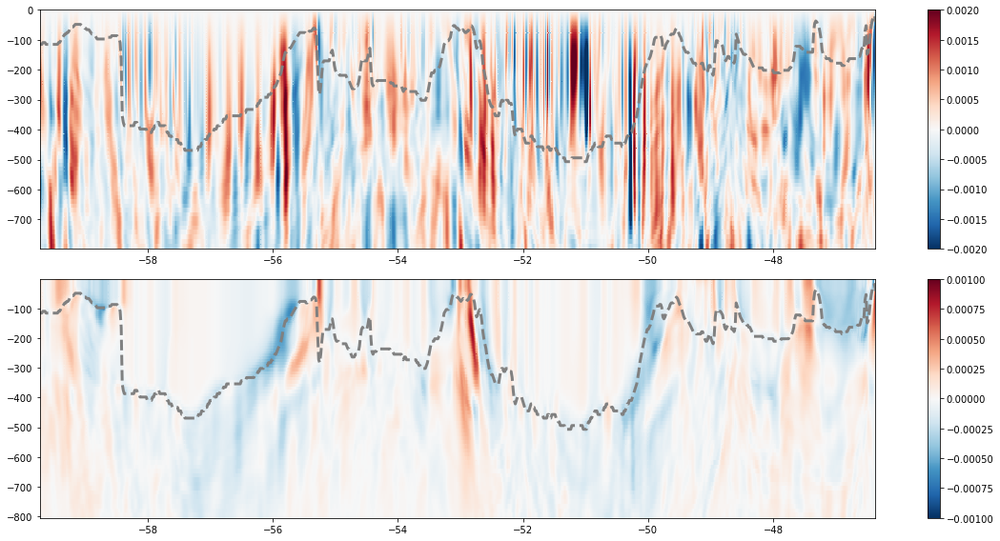

In [39]:
fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=1, figsize=(16,8))
fig.set_tight_layout(True)
im1 = ax1.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -ws03.depthw,
                     ws03[:,300], 
                     cmap='RdBu_r', vmin=-2e-3, vmax=2e-3, rasterized=True)
ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)

im2 = ax2.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -bs03.deptht,
                     bs03[:,300], 
                     cmap='RdBu_r', vmin=-1e-3, vmax=1e-3, rasterized=True)
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -MLD03[300], c='grey', ls='--', lw=3)

fig.colorbar(im1, ax=ax1)
fig.colorbar(im2, ax=ax2)

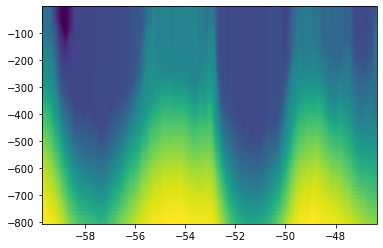

In [40]:
plt.pcolormesh(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300], -b03.deptht, b03[:,300])

(-5e-07, 5e-07)

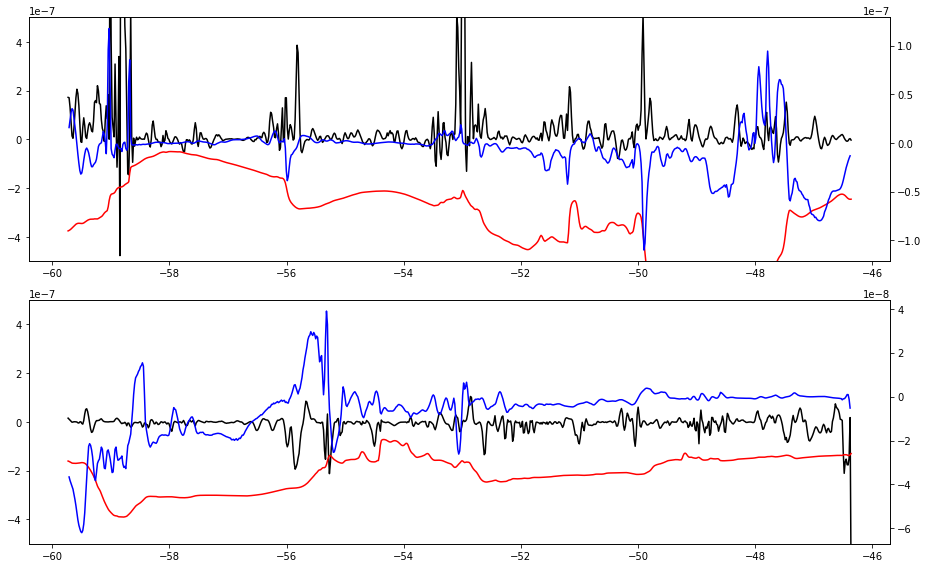

In [47]:
fig, (ax1,ax2) = plt.subplots(figsize=(13,8), nrows=2, ncols=1)
fig.set_tight_layout(True)
ax3 = ax1.twinx()
ax4 = ax2.twinx()

ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300],
         (wsbs01[:,300]*xr.DataArray(e3w[1:len(wsbs01.depthw)+1].data, 
                                     dims='depthw')
         ).where(wsbs01.depthw<MLD01[300]).sum('depthw') * MLD01[300]**-1, 'k')
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300],
         (wsbs03[:,300]*xr.DataArray(e3w[1:len(wsbs03.depthw)+1].data, 
                                     dims='depthw')
         ).where(wsbs03.depthw<MLD03[300]).sum('depthw') * MLD03[300]**-1, 'k')

ax1.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300],
         Bdot01[300], 'r')
ax2.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300],
         Bdot03[300], 'r')

ax3.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1],
         ebf01[299], 'b')
ax4.plot(dsmask.nav_lon.sel(y=slice(ys,ye),x=slice(xs,xe))[300,1:-1],
         ebf03[299], 'b')

ax1.set_ylim([-5e-7,5e-7])
ax2.set_ylim([-5e-7,5e-7])